In [1]:
import json
import os
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats
from scipy.stats import kstest
import numpy as np
import networkx as nx
import pydot
from networkx.drawing.nx_pydot import graphviz_layout
import powerlaw
import statsmodels.api as sm
from statsmodels.api import qqplot
from datetime import datetime, timedelta
from collections import defaultdict
from tqdm import tqdm

import utils.processing_utils as pu
import utils.simulation_utils as su

data_path = "~/Documents/oasis/"

np.set_printoptions(legacy="1.25")
plt.style.use("seaborn-v0_8-colorblind")
fontsize=13
tqdm.pandas()

figsize_regular = (5, 5)
figsize_large = (8, 8)
figsize_wide = (10, 5)
figsize_ultra_wide = (15, 5)
figsize_wide_large = (12, 9)
figsize_long = (5, 10)

In [2]:
experimental_condition = True
save_figs = False
run_perspective = False
output_oswald_data = False
# start_str="reddit-sim_qwen_subreddit-3-24h"
if experimental_condition:
    simulated_conditions = [1, 6]

***
# Load Data

In [3]:
# Load User data and discussions data
user_data = pd.read_csv(
    f"{data_path}data/seed_user_data.csv"
)

discussions_data = pd.read_csv(
    f"{data_path}data/seed_discussions_data.csv"
)

# change post_id in two cases to fit actual post_id
discussions_data.at[679, "post_id"] = "t3_1dfbrcy"
discussions_data.at[680, "post_id"] = "t3_1dfbrcy"

if experimental_condition:
    user_data = user_data[user_data["subreddit"].isin(simulated_conditions)]
    discussions_data = discussions_data[discussions_data["subreddit"].isin(simulated_conditions)]

In [4]:
sim_discussions_dfs = []
sim_user_dfs = []
sim_trace_dfs = []

for i in range(1, 11):
    subdir = "{:02d}".format(i)
    sim_discussions_dfs.append(pd.read_csv(
    f"{data_path}data/{subdir}_run/sim_discussions_data.csv"
    ))
    sim_discussions_dfs[i-1]["topic_content"] = sim_discussions_dfs[i-1]["topic_content"].str.replace("’", "'")
    sim_user_dfs.append(pd.read_csv(
    f"{data_path}data/{subdir}_run/sim_user_data.csv"
    ))
    sim_trace_dfs.append(pd.read_csv(
    f"{data_path}data/{subdir}_run/sim_trace_data.csv"
    ))

In [5]:
len(sim_discussions_dfs)

10

In [6]:
sim_discussions_data = pd.read_csv(
    f"{data_path}data/01_run/sim_discussions_data.csv"
)
sim_discussions_data["topic_content"] = sim_discussions_data["topic_content"].str.replace("’", "'")
sim_user_data = pd.read_csv(
    f"{data_path}data/01_run/sim_user_data.csv"
)
sim_trace_data = pd.read_csv(
    f"{data_path}data/01_run/sim_trace_data.csv"
)

if not run_perspective:
    perspective_data = pd.read_csv(f"{data_path}data/sim_discussions_data_perspective.csv")

In [7]:
# introduce topic to seed data so that seed and sim share an identifier for topic
discussions_data = discussions_data.merge(sim_discussions_data.drop_duplicates(subset="topic_content")[["topic_content", "topic"]], left_on="post_title", right_on="topic_content")

In [8]:
# Extract Baseline (seed) data action histogram (estimated) 
def seed_action_hist(sub):
    data = discussions_data[discussions_data["subreddit"] == sub]
    temp_pos = data[data["score_post"] > 0]
    temp_neg = data[data["score_post"] < 0]
    
    seed_like_post = temp_pos.drop_duplicates(subset="post_id")["score_post"].sum()
    seed_dislike_post = temp_neg.drop_duplicates(subset="post_id")["score_post"].sum()
    
    seed_create_comment = len(data[data["parent_id"].isin(data["post_id"])])
    
    seed_create_comment_comment = len(data[data["parent_id"].isin(data["comment_id"])])
    
    temp_pos = data[data["score_comment"] > 0]
    temp_neg = data[data["score_comment"] < 0]
    
    seed_like_comment = temp_pos.drop_duplicates(subset="comment_id")["score_comment"].sum()
    seed_dislike_comment = abs(temp_neg.drop_duplicates(subset="comment_id")["score_comment"].sum())

    seed_action_hist = [0, seed_create_comment, seed_create_comment_comment, seed_dislike_comment, seed_dislike_post, seed_like_comment, seed_like_post]

    return seed_action_hist

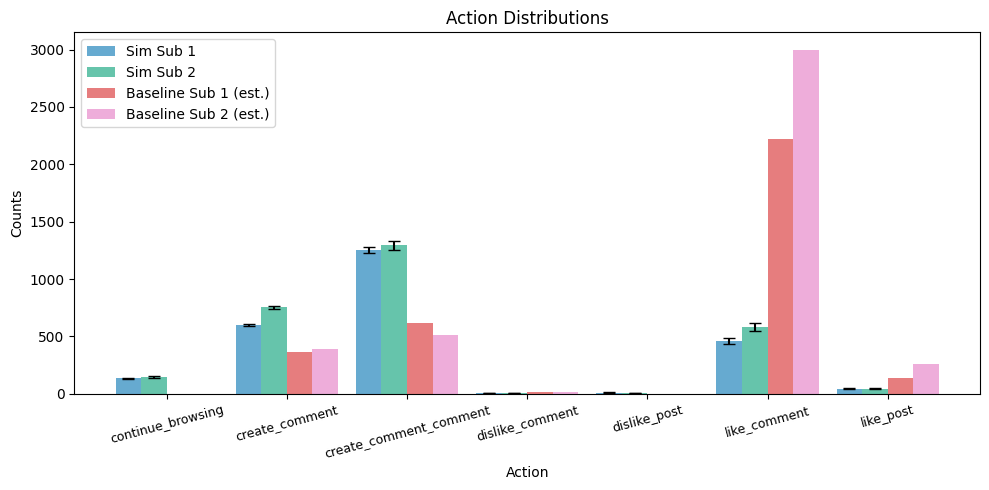

In [201]:
fig, ax = plt.subplots(1, 1, figsize=figsize_wide)
l = 0
bar_width = 0.85 / (len(sim_trace_data["subreddit"].unique())+2)

all_actions = sorted(sim_trace_data[~sim_trace_data["action"].isin(["refresh", "sign_up", "create_post"])]["action"].unique())
x = np.arange(len(all_actions))

subs = {
    1: [],
    2: [],
    3: [],
    4: [],
    5: [],
    6: [],
}

for r in sim_trace_dfs:
    for i, data in r.groupby("subreddit"):
        temp = data[~data["action"].isin(["refresh", "sign_up", "create_post"])].sort_values("action")
        cats = temp["action"].unique()
        counts = temp.groupby("action").size()
    
        # Create a dictionary to map actions to their counts
        counts_dict = dict(zip(cats, counts))
    
        # Ensure all actions are represented in the counts
        subs[i].append([counts_dict.get(action, 0) for action in all_actions])

for i in simulated_conditions:
    # Calculate the position for this set of bars
    bar_positions = x + (l - 1) * bar_width
        
    histograms = subs[i]
    # histograms = np.array(histograms)
    
    # Calculate the mean histogram
    mean_histogram = np.mean(histograms, axis=0)
    
    # Calculate the confidence intervals (e.g., 95% CI)
    confidence_intervals = 1.96 * np.std(histograms, axis=0) / np.sqrt(len(subs[i]))
    
    ax.bar(bar_positions, mean_histogram, width=bar_width, alpha=0.6, label=f"Sim Sub {i if i == 1 else 2}", yerr=confidence_intervals, capsize=4)
    ax.tick_params(axis="x", labelsize=5.5)
    
    ax.set_xlabel("Action")
    ax.set_ylabel("Counts")
    ax.set_title("Action Distributions")
    ax.set_xticks(x + bar_width * (len(sim_trace_data["subreddit"].unique()) - 1) / 2)
    ax.set_xticklabels(all_actions, fontsize=9, rotation=15)
    
    l += 1

for i in simulated_conditions:
    bar_positions = x + (l - 1) * bar_width

    ax.bar(bar_positions, seed_action_hist(i), width=bar_width, alpha=0.6, label=f"Baseline Sub {i if i == 1 else 2} (est.)", color=("tab:red" if i == 1 else "tab:pink"))
    
    l += 1

ax.legend()
plt.tight_layout()
if save_figs:
    plt.savefig(
        f"figures/seed-sim_dist_actions.pdf"
    )
plt.show()

In [10]:
def plot_multirun_hist_a(x, ax=None, bins=20, density=None):
    distributions = [i for i in x]

    bins, bin_width = np.linspace(0, max([max(i) for i in distributions]) + 1, bins + 1, retstep=True)

    histograms = [np.histogram(dist, bins=bins, density=density)[0] for dist in distributions]
    histograms = np.array(histograms)

    mean_histogram = np.mean(histograms, axis=0)

    confidence_intervals = 1.96 * np.std(histograms, axis=0) / np.sqrt(len(distributions))

    bin_centers = (bins[:-1] + bins[1:]) / 2

    if ax == None:
        fig, ax = plt.subplots(1, 1)
        
    ax.bar(bin_centers, mean_histogram, width=np.diff(bins), yerr=confidence_intervals, capsize=4, label="Sim")
    ax.set_ylim(0)
    ax.set_xlim(0)

    return ax, bin_width

In [11]:
def plot_multirun_hist_b(x, data=None, ax=None, bins=20, density=False):
    if data == None:
        distributions = [i[x] for i in sim_discussions_dfs]
    else:
        distributions = [i[x] for i in data]

    bins, width = np.linspace(0, max([max(i) for i in distributions]) + 1, bins + 1, retstep=True)

    histograms = [np.histogram(dist, bins=bins, density=density)[0] for dist in distributions]
    histograms = np.array(histograms)

    mean_histogram = np.mean(histograms, axis=0)

    confidence_intervals = 1.96 * np.std(histograms, axis=0) / np.sqrt(len(distributions))

    bin_centers = (bins[:-1] + bins[1:]) / 2

    if ax == None:
        fig, ax = plt.subplots(1, 1)
    
    ax.bar(bin_centers, mean_histogram, width=np.diff(bins), yerr=confidence_intervals, capsize=4, label="Sim")
    ax.set_ylim(0)

    return ax, width

In [12]:
def binner(x, width):
    bins = [0]
    i = 1
    while bins[-1] < np.max(x):
        bins.extend([width * i])
        i += 1
    return bins

***
# Structural Analysis

In [13]:
def round_mean(data, mode="mean", digits=3):
    if mode == "mean":
        return round(np.mean(data), digits)
    elif mode == "median":
        return round(np.median(data), digits)

def get_ci(x, mode="mean", q = 0.5, digits=3):
    data = x.copy()
    if not isinstance(data, list):
        data = list(data)
    data.sort()
    mean, std, n = np.mean(data), np.std(data, ddof=1), len(data)
    z = 1.96
    
    error = z * (std / np.sqrt(n))

    median_error = z * np.sqrt(n*q*(1-q))

    if mode == "mean":
        return round(mean - error, digits), round(mean + error, digits)
    elif mode == "median":
        lb = int(round(n * q - median_error, 0))
        ub = int(round(n * q + median_error, 0))
        lb = max(0, lb)
        ub = min(n - 1, ub)
        return round(data[lb], digits), round(data[ub], digits) 

In [14]:
def get_ci(x, mode="mean", digits=3):
    data = x.copy()
    if not isinstance(data, list):
        data = list(data)
    data.sort()
    return round(np.std(data), digits), (min(data), max(data))

In [172]:
def get_ci(x, mode="mean", digits=3):
    data = x.copy()
    if not isinstance(data, list):
        data = list(data)
    data.sort()
    return round(np.std(data), digits)

In [15]:
## Comparison of 
temp = list(user_data["comment_count"])
seed_avg_comment_count = round_mean(temp), get_ci(temp)
seed_median_comment_count = round_mean(temp, "median"), get_ci(temp, "median")

temp = list(discussions_data["score_comment"])
seed_avg_score_comment = round_mean(temp), get_ci(temp)
seed_median_score_comment = round_mean(temp, "median"), get_ci(temp, "median")

seed_min_score_comment = min(discussions_data["score_comment"])
seed_max_score_comment = max(discussions_data["score_comment"])


temp = [i for j in [i["sim_comment_count"] for i in sim_user_dfs] for i in j]
sim_avg_comment_count = (
    round_mean(temp),
    get_ci(temp)
)
sim_median_comment_count = (
    round_mean(temp, mode="median"),
    get_ci(temp, mode="median")
)

temp = [i for j in [i["sim_score_comment"] for i in sim_discussions_dfs] for i in j]
sim_avg_score_comment = (
    round_mean(temp),
    get_ci(temp)
)
sim_median_score_comment = (
    round_mean(temp, mode="median"),
    get_ci(temp, mode="median")
)

temp = [i["sim_score_comment"] for i in sim_discussions_dfs]
sim_min_score_comment = (
    round_mean([min(i) for i in temp]),
    get_ci([min(i) for i in temp])
)
sim_max_score_comment = (
    round_mean([max(i) for i in temp]),
    get_ci([max(i) for i in temp])
)

temp = [len(i[i["sim_comment_count"] != 0]) for i in sim_user_dfs]
sim_avg_n_users = (
    round_mean(temp),
    get_ci(temp)
)

temp = [len(i[i["sim_comment_count"] == 0]) for i in sim_user_dfs]
sim_avg_n_silent_users = (
    round_mean(temp),
    get_ci(temp)
)

temp = [len(i) for i in sim_discussions_dfs]
sim_avg_n_posts = (
    round_mean(temp),
    get_ci(temp)
)


print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("All Users/Agents", "Seed", "CI", "Sim", "CI"))
print("-"*80)
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("N Agents", len(user_data), "-", len(sim_user_data), "-"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("N Active Agents", len(user_data[user_data["comment_count"] != 0]), "-", sim_avg_n_users[0], f"{sim_avg_n_users[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("N Silent Agents", len(user_data[user_data["comment_count"] == 0]), "-", sim_avg_n_silent_users[0], f"{sim_avg_n_silent_users[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("N Comments", len(discussions_data), "-", sim_avg_n_posts[0], f"{sim_avg_n_posts[1]}"))
# print("-"*80)
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Comment Count:", seed_avg_comment_count[0], f"{seed_avg_comment_count[1]}", sim_avg_comment_count[0], f"{sim_avg_comment_count[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Comment Count:", seed_median_comment_count[0], f"{seed_median_comment_count[1]}", sim_median_comment_count[0], f"{sim_median_comment_count[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Comment Score:", seed_avg_score_comment[0], f"{seed_avg_score_comment[1]}", sim_avg_score_comment[0], f"{sim_avg_score_comment[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Comment Score:", seed_median_score_comment[0], f"{seed_median_score_comment[1]}", sim_median_score_comment[0], f"{sim_median_score_comment[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Min Comment Score:", seed_min_score_comment, "-", sim_min_score_comment[0], f"{sim_min_score_comment[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Max Comment Score:", seed_max_score_comment, "-", sim_max_score_comment[0], f"{sim_max_score_comment[1]}"))

All Users/Agents                 Seed   CI             |   Sim    CI             
--------------------------------------------------------------------------------
N Agents                         180    -              |   180    -              
N Active Agents                  114    -              |  172.7   (1.792, (170, 176))
N Silent Agents                   66    -              |   7.3    (1.792, (4, 10))
N Comments                       1897   -              |  3899.4  (50.062, (3829, 3973))
Average Comment Count:          10.539  (17.871, (0.0, 87.0))|  21.663  (14.242, (0.0, 78.0))
Median Comment Count:            3.0    (17.871, (0.0, 87.0))|   20.0   (14.242, (0.0, 78.0))
Average Comment Score:          2.736   (2.572, (-4, 22))|  0.263   (0.975, (-2, 30))
Median Comment Score:            2.0    (2.572, (-4, 22))|   0.0    (0.975, (-2, 30))
Min Comment Score:                -4    -              |   -1.2   (0.4, (-2, -1))
Max Comment Score:                22    -              

In [159]:
# SD of max comment count accross runs
np.std([i["sim_score_comment"].max() for i in sim_discussions_dfs])

4.8207883172775805

In [183]:
# if not run_perspective:
perspective_data.groupby(["n_run", "topic_content"])["seed_user_id"].nunique().groupby("topic_content").apply(get_ci, digits=0)

topic_content
A universal basic income would kill the economy.                                                          5.0
Airbnb should be banned in cities.                                                                        4.0
Artificial intelligence should replace humans where possible.                                             1.0
Climate change is one of the greatest threats to humanity.                                                5.0
Employers should mandate vaccination.                                                                     4.0
Fur clothing should be banned.                                                                            3.0
Immigration should be regulated more strictly.                                                            4.0
Police officers should wear body cameras.                                                                 4.0
Prostitution should be illegal.                                                                           

In [16]:
for i in simulated_conditions:
    seed_sub_volume = len(discussions_data[discussions_data["subreddit"] == i])
    sim_sub_volume = round_mean([len(r[r["subreddit"] == i]) for r in sim_discussions_dfs])
    sim_sub_volume_ci = get_ci([len(r[r["subreddit"] == i]) for r in sim_discussions_dfs])
    print("#"*80)
    print("{:^80}".format(f"Sub {i}"))
    print("#"*80)
    print("{:<30}{:^10}{:<5}|{:^10}{:<25}".format("Volume per Sub", "Seed", "CI", "Sim", "CI"))
    print("{:<30}{:^10}{:<5}|{:^10}{:<25}".format("Volume", seed_sub_volume, "-", sim_sub_volume, f"{sim_sub_volume_ci}"))

################################################################################
                                     Sub 1                                      
################################################################################
Volume per Sub                   Seed   CI   |   Sim    CI                       
Volume                           982    -    |  1853.6  (46.659, (1760, 1912))   
################################################################################
                                     Sub 6                                      
################################################################################
Volume per Sub                   Seed   CI   |   Sim    CI                       
Volume                           915    -    |  2045.8  (62.608, (1933, 2114))   


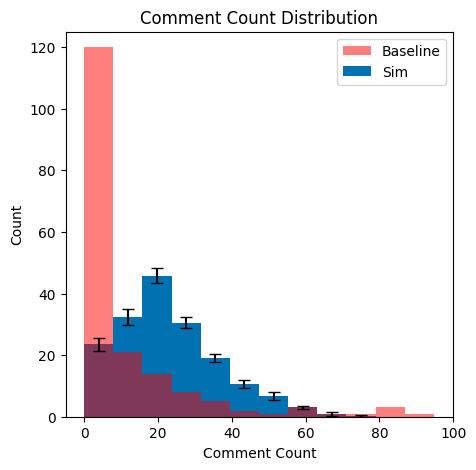

In [17]:
fig, ax = plt.subplots(1, 1, figsize=figsize_regular)

temp_sim = []
for i in sim_discussions_dfs:
    temp_sim.append(list(i.groupby("seed_user_id").size()))
    
_, bw = plot_multirun_hist_a(temp_sim, ax=ax, bins=10)

temp = user_data["comment_count"]
ax.hist(temp, color="r", alpha=0.5, label="Baseline", bins=binner(temp, bw))
ax.set_xlabel("Comment Count")
ax.set_ylabel("Count")
ax.set_xlim(-5, 100)
ax.set_ylim(0, 125)
ax.legend()
ax.set_title("Comment Count Distribution")
if save_figs:
    plt.savefig("figures/seed-sim_dist_comment-counts.pdf")
plt.show()

In [18]:
# Corr between subreddits' thread volumes Baseline data
t = discussions_data.groupby(["subreddit", "topic"]).size().unstack()
scipy.stats.pearsonr(t.iloc[0], t.iloc[1])

PearsonRResult(statistic=-0.13641213322734433, pvalue=0.566330371585737)

In [19]:
# Correlation between subreddits' simulated thread volumes across runs
temp_1 = []
temp_6 = []
for r in sim_discussions_dfs:
    temp_1.append(list(r.groupby(["subreddit", "topic"]).size().unstack().iloc[0]))
    temp_6.append(list(r.groupby(["subreddit", "topic"]).size().unstack().iloc[1]))

temp = [[],[]]
for i in range(len(temp_1)):
    r = scipy.stats.pearsonr(temp_1[i], temp_6[i])
    temp[0].append(r[0])
    temp[1].append(r[1])

print(round_mean(temp[0]), get_ci(temp[0]))
print(round_mean(temp[1]), get_ci(temp[1]))

0.813 (0.054, (0.7501161756061822, 0.8898228942083068))
0.0 (0.0, (1.5136737997284403e-07, 0.00013956779686881226))


In [20]:
# Corr between subreddits' thread volumes for Baseline and avg. sim values
temp_1_avg = [np.mean([i[j] for i in temp_1]) for j in range(len(temp_1[0]))]
temp_6_avg = [np.mean([i[j] for i in temp_6]) for j in range(len(temp_6[0]))]

print(scipy.stats.pearsonr(temp_1_avg, t.iloc[0]))
print(scipy.stats.pearsonr(temp_6_avg, t.iloc[1]))

PearsonRResult(statistic=-0.16620776077485072, pvalue=0.48371625175623195)
PearsonRResult(statistic=-0.08253213598078163, pvalue=0.7294027905186234)


In [21]:
# Mean and CI correlation between sim sub 1 and 6 comment volume
r = [[],[]]
p = [[],[]]

r[0].append([scipy.stats.pearsonr(i, t.iloc[0])[0] for i in temp_1])
p[0].append([scipy.stats.pearsonr(i, t.iloc[0])[1] for i in temp_1])

r[1].append([scipy.stats.pearsonr(i, t.iloc[0])[0] for i in temp_6])
p[1].append([scipy.stats.pearsonr(i, t.iloc[0])[1] for i in temp_6])

In [22]:
# sub1 sim and seed corr per thread comment vol
round_mean(p[0][0]), get_ci(p[0][0])

(0.519, (0.229, (0.15734689587905673, 0.9061175892852523)))

In [23]:
# sub6 sim and seed corr per thread comment vol
round_mean(p[1][0]), get_ci(p[1][0])

(0.394, (0.156, (0.1707554938241045, 0.6453788935479808)))

In [169]:
# topic volume correlation between Baseline and simulated data
seed_volume_per_topic = list(discussions_data.groupby(["topic"]).size())
sim_volume_per_topic = []
for i in range(1, 21):
    topic_temp = []
    for r in sim_discussions_dfs:
        topic_temp.append(len(r[r["topic"] == i]))
    sim_volume_per_topic.append(topic_temp)

temp = scipy.stats.pearsonr(seed_volume_per_topic, [np.mean(i) for i in sim_volume_per_topic])
print(f"Correlation: Baseline/simulated volume per topic: {temp[0]} (p={temp[1]})")
print()

for i in range(len(seed_volume_per_topic)):
    topic = discussions_data[discussions_data["topic"] == i+1]["post_title"].iloc[0]
    # print("{:<110}{:^10}{:^10}{:<20}".format(topic, seed_volume_per_topic[i], round_mean(sim_volume_per_topic[i]), f"{get_ci(sim_volume_per_topic[i])}"))
    print("{:<110}{:^10}{:^10}{:<20}".format(topic, "", "", f"{round(get_ci(sim_volume_per_topic[i])[0], 0)}"))

Correlation: Baseline/simulated volume per topic: -0.26516472835270766 (p=0.258530999289708)

The US should condemn Israel's military actions in Gaza as acts of genocide and impose full sanctions.                            14.0                
Prostitution should be illegal.                                                                                                   17.0                
Things like gender-neutral language and stating pronouns are silly issues.                                                        28.0                
The death penalty should be reestablished US-wide.                                                                                14.0                
The US should provide financial and military aid to Ukraine.                                                                      17.0                
We need stricter gun control laws.                                                                                                21.0                


In [25]:
y = sim_user_data.sort_values("seed_user_id")["sim_comment_count"]
x = user_data.sort_values("ParticipantID")["comment_count"]

scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=0.12121041020356813, pvalue=0.10504748896109899)

In [26]:
# Visualize the thread structure in tree form

def visualize_thread_tree(subreddit_data, data_type, plot=True):

    # Create tree levels and record nodes present
    def populate_levels(node, level):
        levels[level] += 1
        for neighbor in bfs_tree.neighbors(node):
            if bfs_tree.nodes[neighbor].get("level", None) is None:
                bfs_tree.nodes[neighbor]["level"] = level + 1
                populate_levels(neighbor, level + 1)

    if data_type == "seed":
        seed_post_id_col = "post_id"
        parent_id_col = "parent_id"
        user_id_col = "ParticipantID"
        topic_post_content_col = "post_title"
        unified_seed_post_id_col = "topic"
    elif data_type == "sim":
        seed_post_id_col = "topic"
        parent_id_col = "parent_comment_id"
        user_id_col = "user_id"
        topic_post_content_col = "topic_content"
        unified_seed_post_id_col = "topic"
    else:
        raise ValueError("Select either 'seed' or 'sim'.")

    tree_metrics = {
        "degree_centrality": [],
        "degrees": [],
        "density": [],
        "depth": [],
        "width": [],
        "size": [],
        "avg_degree": None,
        "median_degree": None,
        "node_connectivity": [],
    }               

    thread_list = list(subreddit_data[seed_post_id_col].drop_duplicates())
    
    for i in thread_list:
        thread_tree = []
        node_labels = {}
        
        temp = subreddit_data[subreddit_data[seed_post_id_col] == i]
        
        for j, r in temp.iterrows():
            if data_type == "sim":
                if r[parent_id_col] == -1:
                    thread_tree.append((0, r["comment_id"]))
                else:
                    thread_tree.append((r[parent_id_col], r["comment_id"]))
            else:
                if r[parent_id_col] == r[seed_post_id_col]:
                    thread_tree.append((0, r["comment_id"]))
                else:
                    thread_tree.append((r[parent_id_col], r["comment_id"]))
            node_labels[r["comment_id"]] = r[user_id_col]
        
        G = nx.Graph()
        G.add_edges_from(thread_tree)
        pos = graphviz_layout(G, prog="dot")

        if plot:
            fig, axs = plt.subplots(1, 1, figsize=(25, 10))

            nx.draw_networkx_nodes(
                G, pos, node_size=300,
                node_color=("tab:blue" if data_type == "sim" else "tab:red"),
                alpha=0.5
            )
            nx.draw_networkx_edges(G, pos)
            nx.draw_networkx_labels(
                G, pos, labels=node_labels,
                font_weight="bold", font_size=8
            )
    
            plt.suptitle(f"{data_type.upper()} - Discussion Network Topic {list(temp[unified_seed_post_id_col])[0]}")
            plt.title(f"{list(temp[topic_post_content_col])[0]}")
            if save_figs:
                plt.savefig(
                    f"figures/{data_type}_trees/{data_type}_topic-{list(temp[unified_seed_post_id_col])[0]}_thread-tree.pdf"
                )
            plt.show()

        levels = defaultdict(int)
        bfs_tree = nx.bfs_tree(G, source=0)
        populate_levels(0, 0)

        tree_metrics["degree_centrality"].append(nx.degree_centrality(G))
        tree_metrics["degrees"].append(list(dict(nx.degree(G)).values()))
        tree_metrics["density"].append(nx.density(G))
        tree_metrics["depth"].append(max(levels.keys()))
        tree_metrics["width"].append(max(levels.values()))
        tree_metrics["size"].append(nx.number_of_nodes(G))
        tree_metrics["node_connectivity"].append(nx.node_connectivity(G))

    tree_metrics["avg_degree"] = round_mean(
        [i for j in tree_metrics["degrees"] for i in j]
    )
    tree_metrics["median_degree"] = round_mean(
        [i for j in tree_metrics["degrees"] for i in j], mode="median"
    )

    return tree_metrics

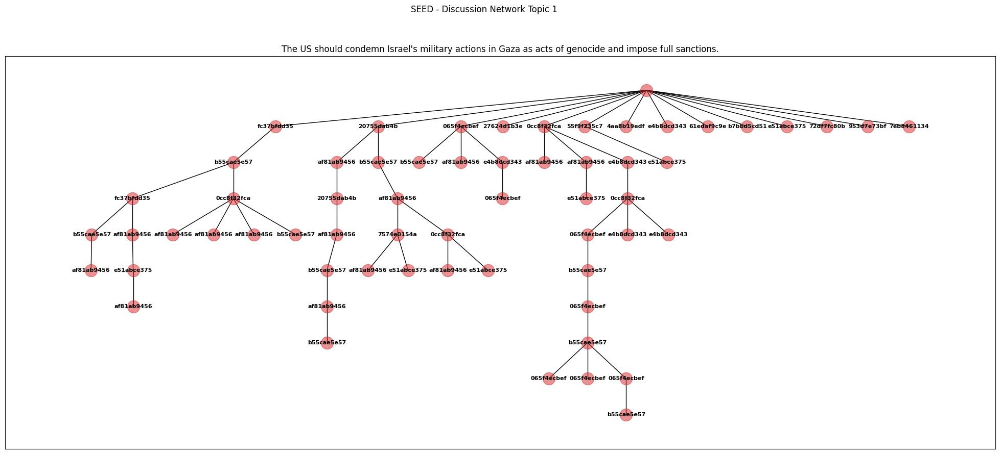

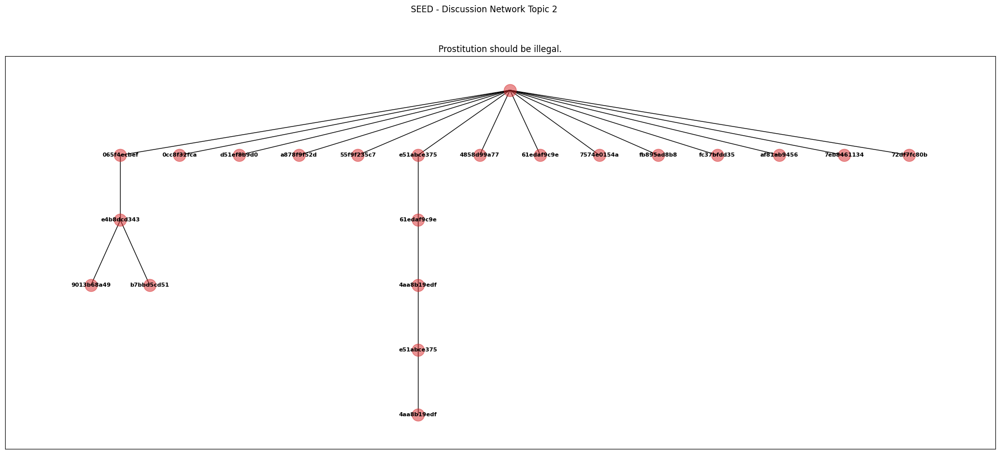

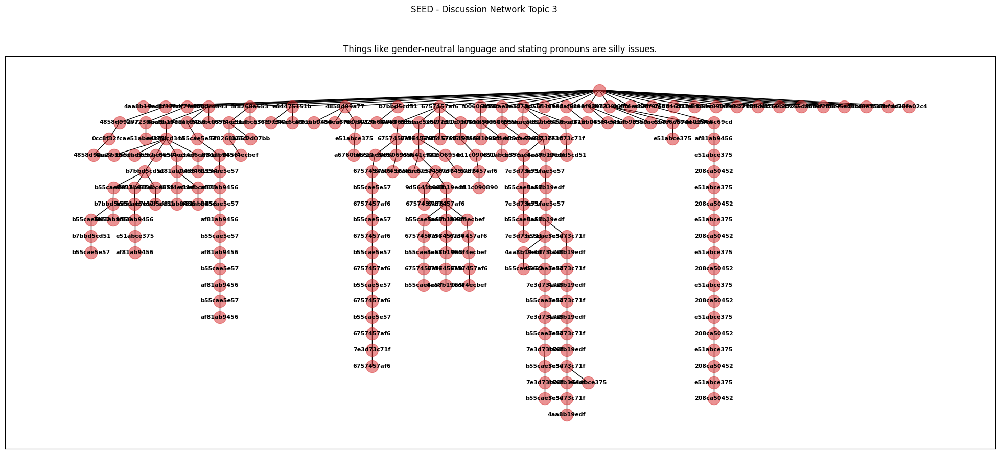

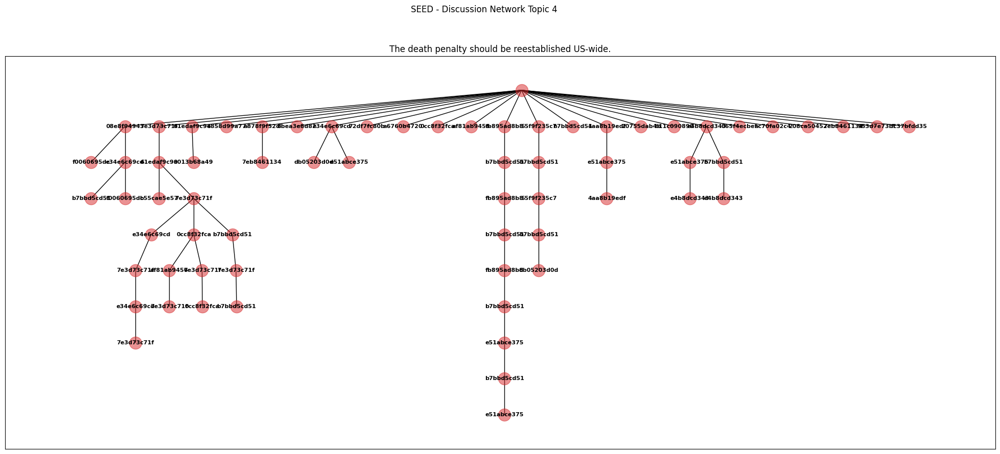

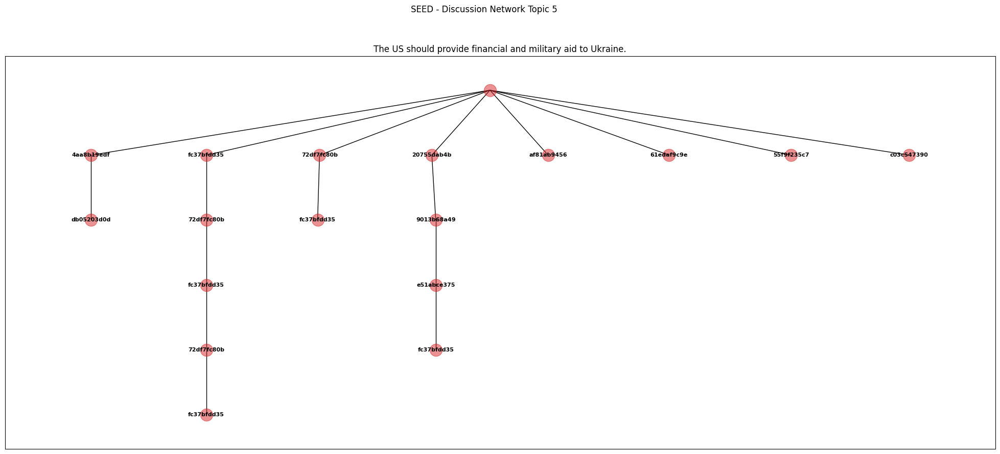

...

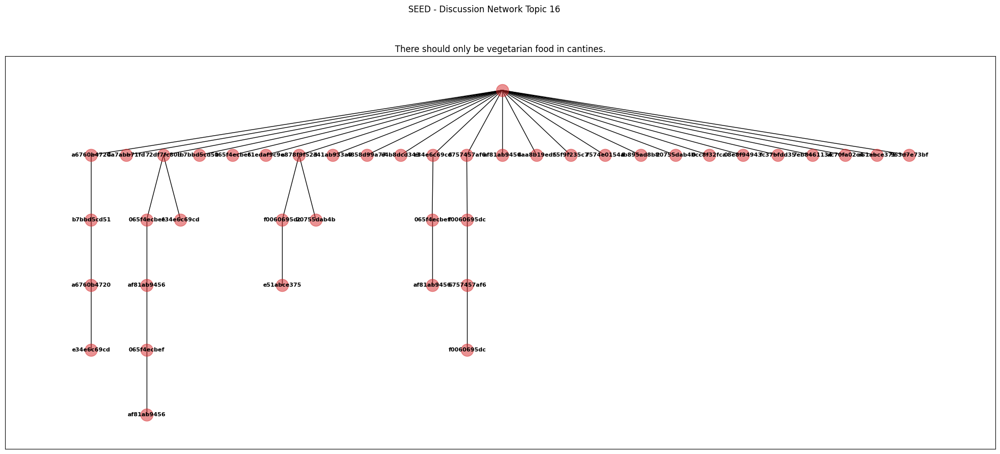

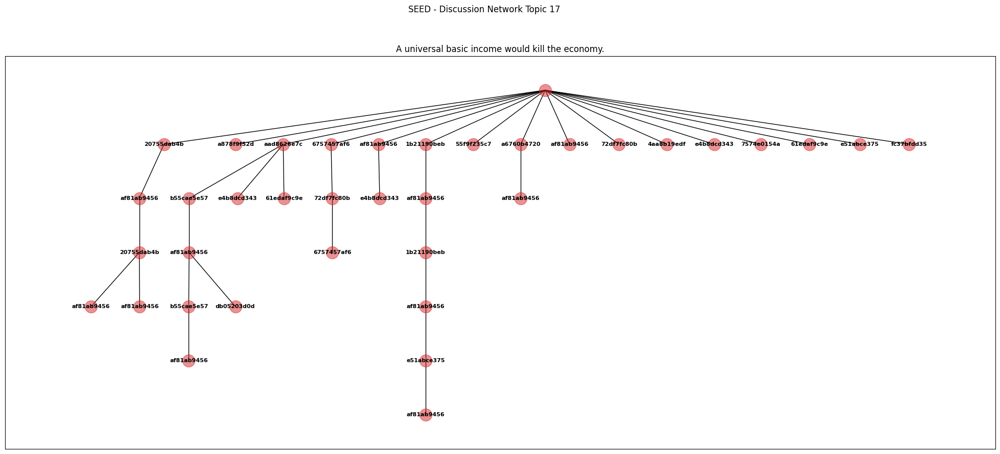

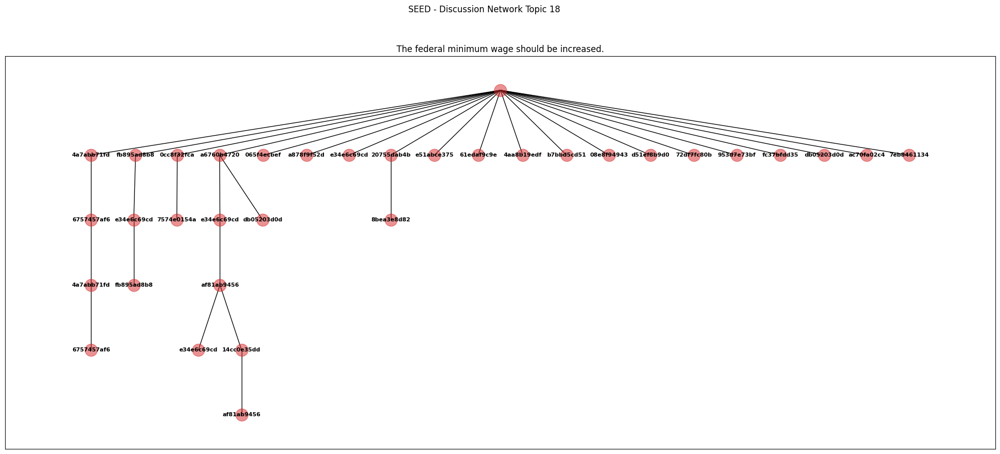

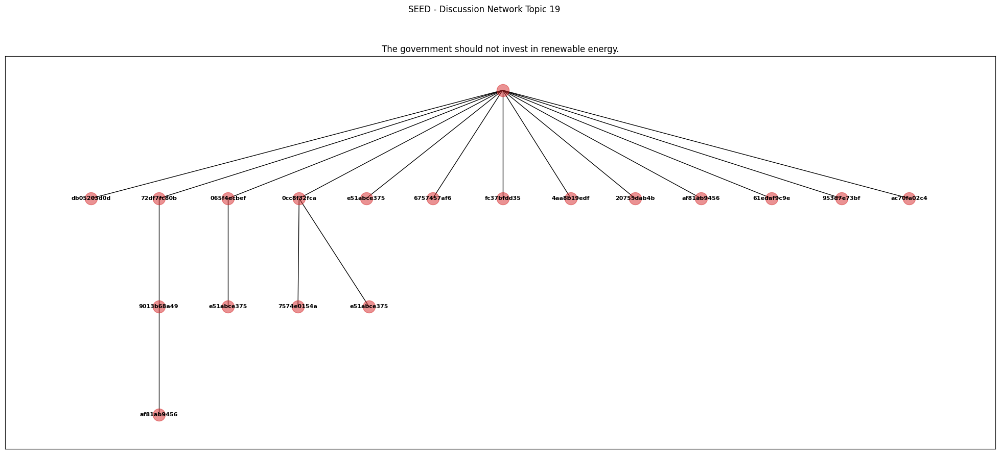

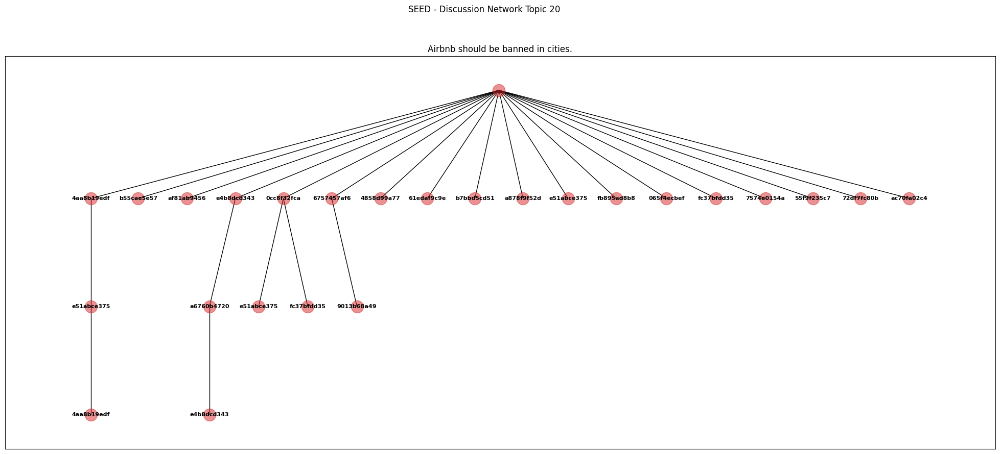

In [27]:
seed_network = {}
for i in simulated_conditions:
    temp = discussions_data[discussions_data["subreddit"] == i].sort_values(["topic", "created_comment"])
    seed_network[i] = visualize_thread_tree(temp, data_type="seed", plot=(True if i == 1 else False))

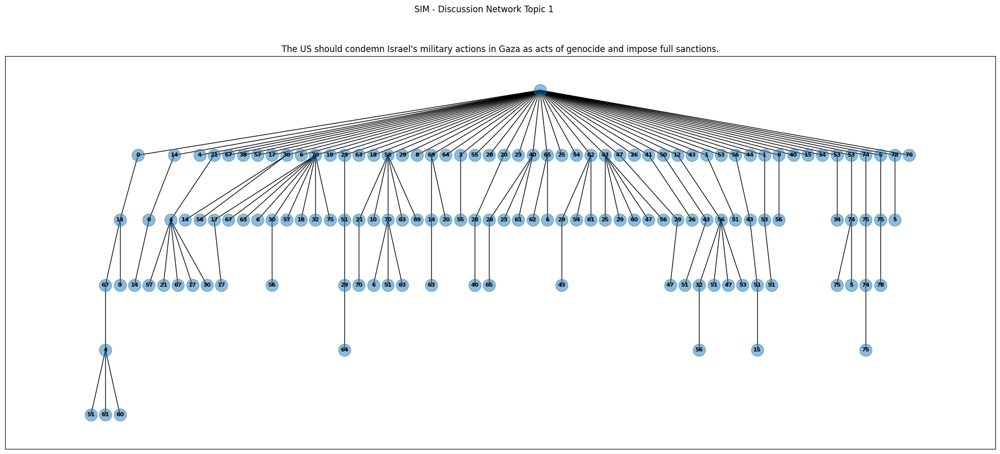

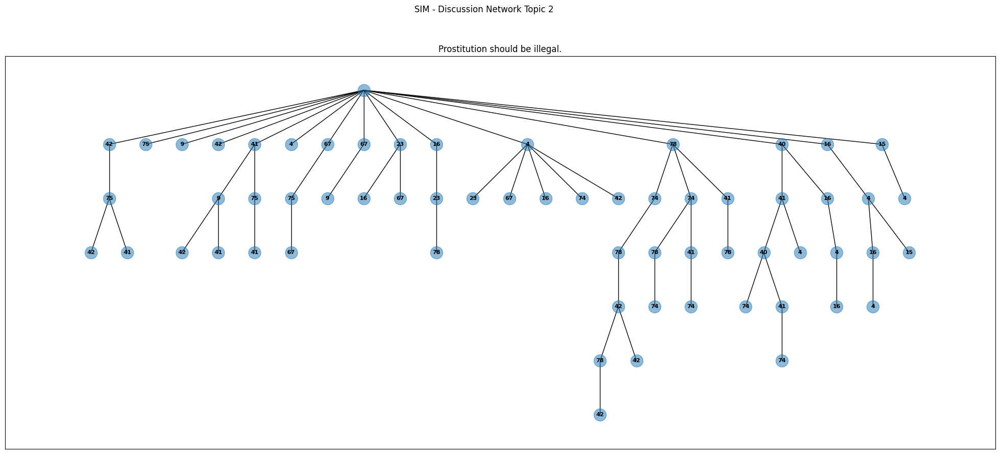

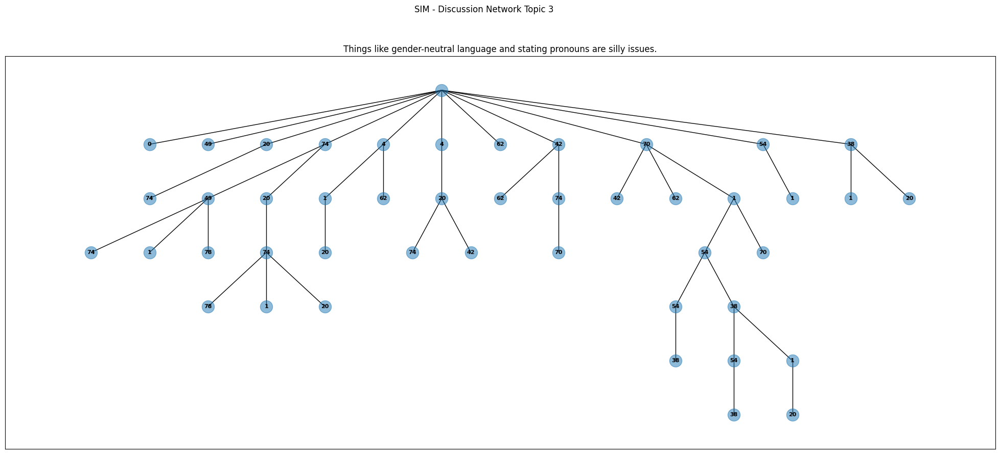

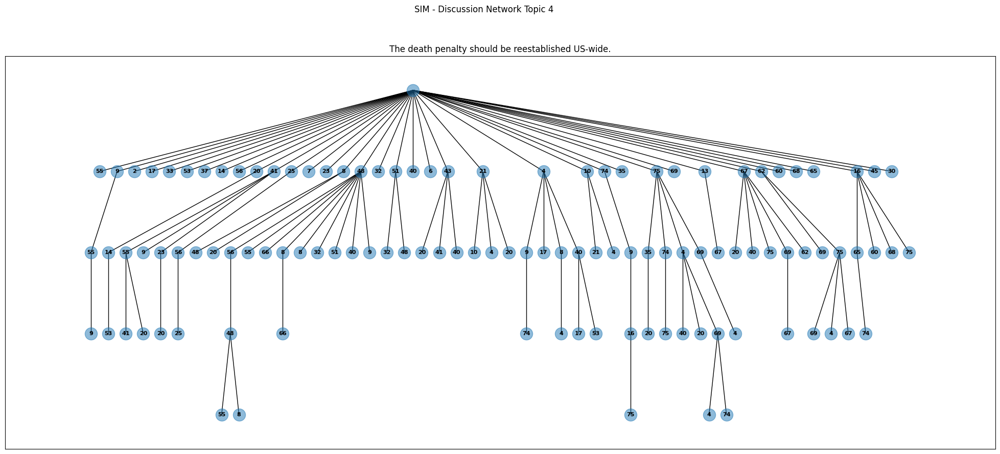

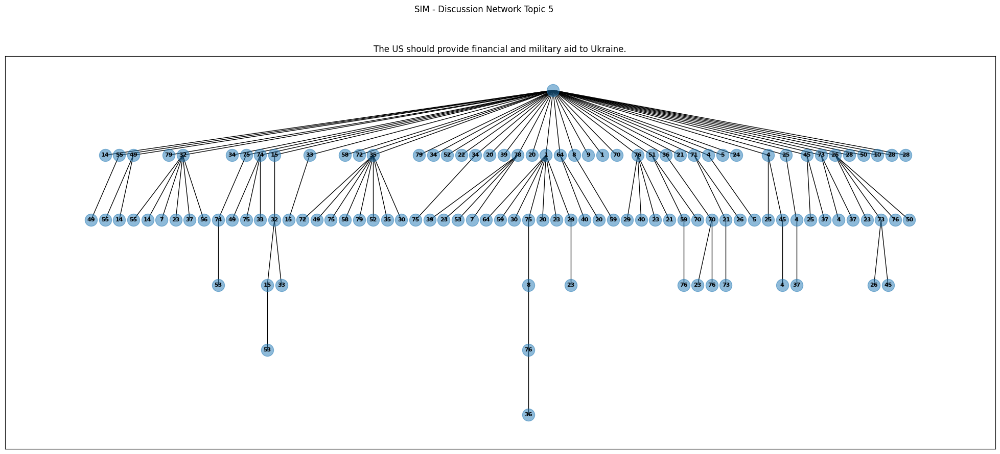

...

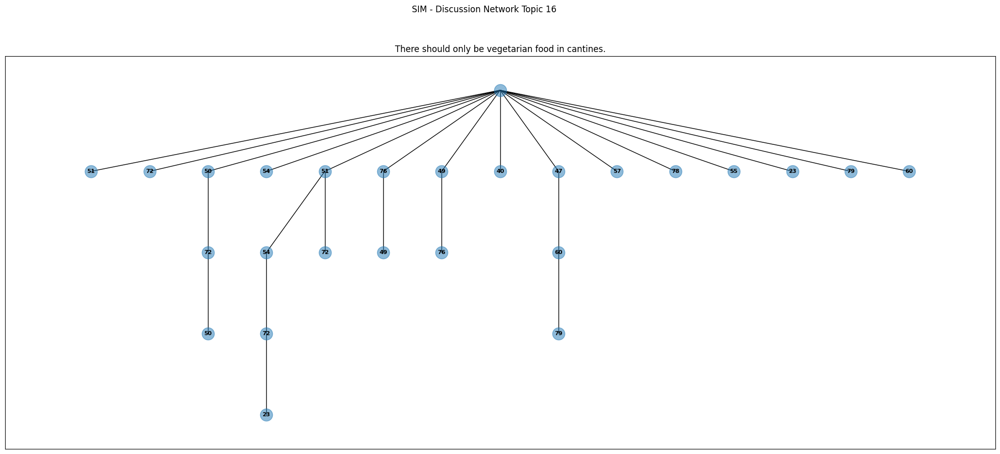

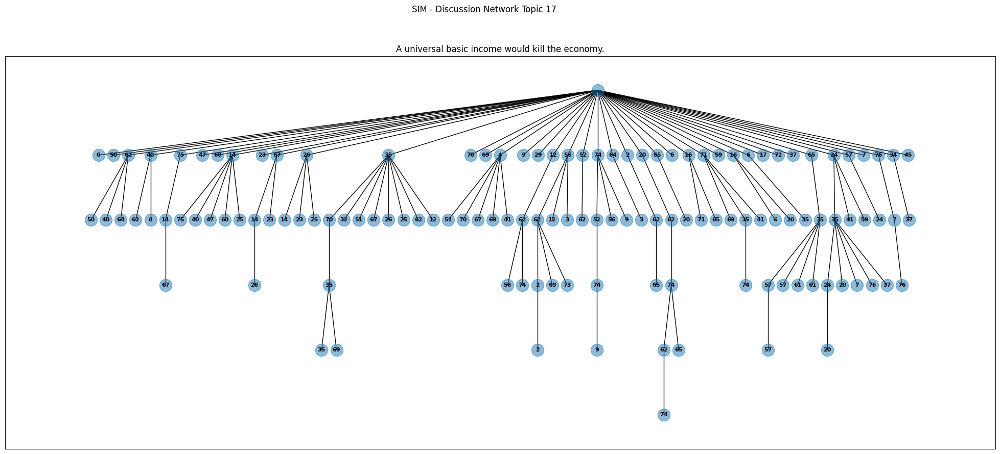

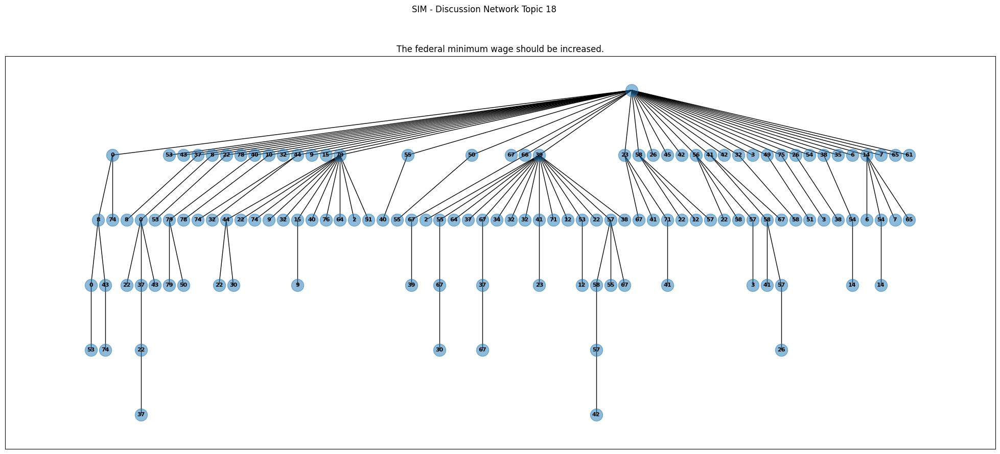

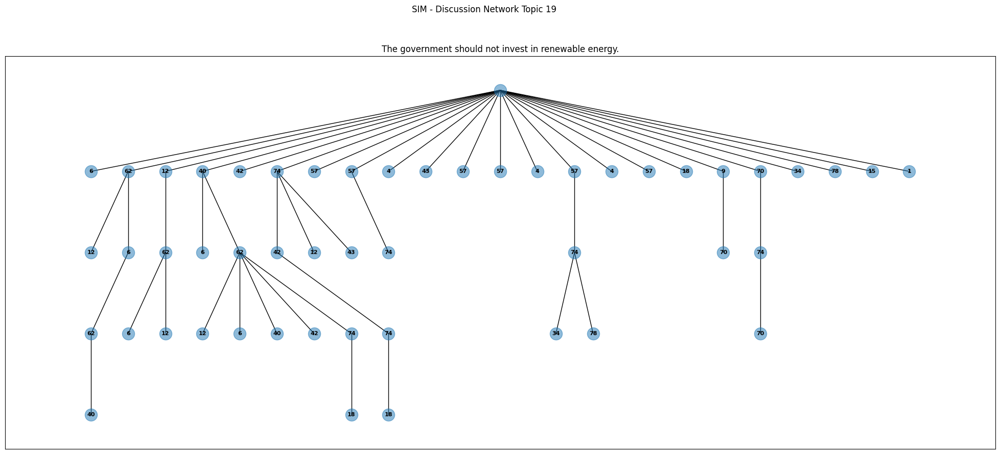

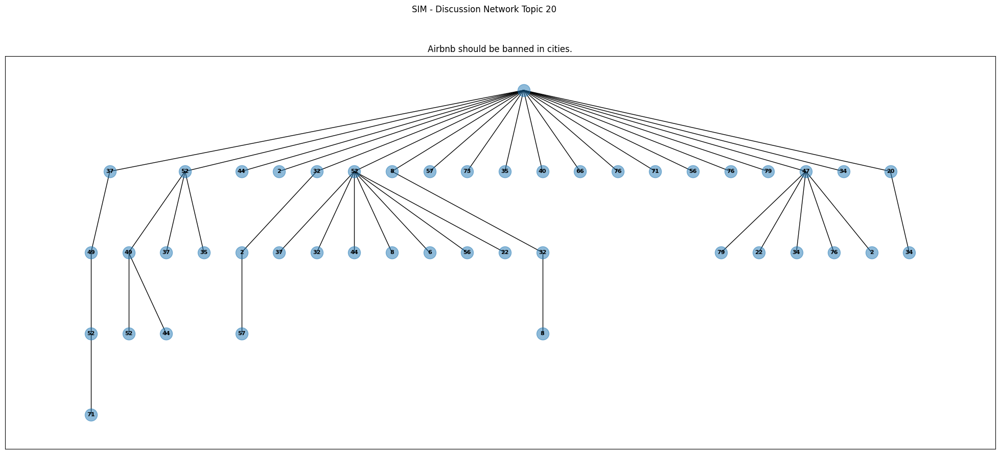

In [28]:
sim_network = []
k = 0
for r in sim_discussions_dfs:
    run_dict = {}
    for i in simulated_conditions:
        temp = r[r["subreddit"] == i]
        run_dict[i] = visualize_thread_tree(temp, data_type="sim", plot=(True if k == 0 else False))
        k += 1
    sim_network.append(run_dict)

In [152]:
temp_corr_seed = []
temp_corr_sim = []

for i in simulated_conditions:
    temp = [j for k in seed_network[i]["degrees"] for j in k]
    seed_avg_degree = round_mean(temp), get_ci(temp)
    seed_median_degree = round_mean(temp, mode="median"), get_ci(temp, mode="median")
    
    temp = seed_network[i]["density"]
    seed_avg_density = round_mean(temp), get_ci(temp)
    seed_median_density = round_mean(temp, mode="median"), get_ci(temp, mode="median")

    temp = seed_network[i]["depth"]
    seed_avg_depth = round_mean(temp), get_ci(temp)
    seed_median_depth = round_mean(temp, mode="median"), get_ci(temp, mode="median")

    temp = seed_network[i]["width"]
    seed_avg_width = round_mean(temp), get_ci(temp)
    seed_median_width = round_mean(temp, mode="median"), get_ci(temp, mode="median")
    
    user_sub_data = user_data[user_data["subreddit"] == i]
    seed_active_users = round(len(user_sub_data[user_sub_data["comment_count"] != 0]) / len(user_sub_data), 3)

    discussions_sub_data = discussions_data[discussions_data["subreddit"] == i]
    user_sub_data = user_data[user_data["subreddit"] == i]
    seed_scale_per_topic = discussions_sub_data.groupby("post_title")["ParticipantID"].nunique() 
    seed_n_users_per_sub = user_sub_data["ParticipantID"].nunique()
    seed_active_users_per_topic = np.array(seed_scale_per_topic) / seed_n_users_per_sub
    # seed_active_users_per_topic = seed_active_users_per_topic.reset_index()
    # seed_active_users_per_topic.columns = ["topic", "actives"]
    seed_avg_active_users_per_topic = round_mean(seed_active_users_per_topic), get_ci(seed_active_users_per_topic)
    seed_median_active_users_per_topic = round_mean(seed_active_users_per_topic, "median"), get_ci(seed_active_users_per_topic, "median")
    temp_corr_seed.append(seed_active_users_per_topic)


    temp = [j for k in [r[i]["degrees"] for r in sim_network] for x in k for j in x]
    sim_avg_degree = round_mean(temp), get_ci(temp)
    sim_median_degree = round_mean(temp, mode="median"), get_ci(temp, mode="median")
    
    sim_user_sub_data = [r[r["subreddit"] == i] for r in sim_user_dfs]
    temp = [round(len(r[r["sim_comment_count"] != 0]) / len(r), 3) for r in sim_user_sub_data]
    sim_active_users = round_mean(temp), get_ci(temp)

    temp = [j for k in [r[i]["density"] for r in sim_network] for j in k]
    sim_avg_density = round_mean(temp), get_ci(temp)
    sim_median_density = round_mean(temp, mode="median"), get_ci(temp, mode="median")

    temp = [j for k in [r[i]["depth"] for r in sim_network] for j in k]
    sim_avg_depth = round_mean(temp), get_ci(temp)
    sim_median_depth = round_mean(temp, mode="median"), get_ci(temp, mode="median")

    temp = [j for k in [r[i]["width"] for r in sim_network] for j in k]
    sim_avg_width = round_mean(temp), get_ci(temp)
    sim_median_width = round_mean(temp, mode="median"), get_ci(temp, mode="median")
    
    sim_discussions_sub_data = [r[r["subreddit"] == i] for r in sim_discussions_dfs]
    sim_user_sub_data = [r[r["subreddit"] == i] for r in sim_user_dfs]
    sim_scale_per_topic = [i.groupby("topic")["seed_user_id"].nunique() for i in sim_discussions_sub_data]
    sim_n_users_per_sub = sim_user_sub_data[0]["seed_user_id"].nunique()
    sim_active_users_per_topic = np.array(sim_scale_per_topic) / np.array(sim_n_users_per_sub)
    temp = [i for j in sim_active_users_per_topic for i in j]
    sim_avg_active_users_per_topic = round_mean(temp), get_ci(temp)
    sim_median_active_users_per_topic = round_mean(temp, "median"), get_ci(temp, "median")
    temp_corr_sim.append(temp)

    print("#"*80)
    print("{:^80}".format(f"Subreddit {i}"))
    print("#"*80)
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Tree Structure", "Seed", "CI", "Sim", "CI"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Degree:", seed_avg_degree[0], f"{seed_avg_degree[1]}", sim_avg_degree[0], f"{sim_avg_degree[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Degree:", seed_median_degree[0], f"{seed_median_degree[1]}", sim_median_degree[0], f"{sim_median_degree[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Density:", seed_avg_density[0], f"{seed_avg_density[1]}", sim_avg_density[0], f"{sim_avg_density[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Density:", seed_median_density[0], f"{seed_median_density[1]}", sim_median_density[0], f"{sim_median_density[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Depth:", seed_avg_depth[0], f"{seed_avg_depth[1]}", sim_avg_depth[0], f"{sim_avg_depth[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Depth:", seed_median_depth[0], f"{seed_median_depth[1]}", sim_median_depth[0], f"{sim_median_depth[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Width:", seed_avg_width[0], f"{seed_avg_width[1]}", sim_avg_width[0], f"{sim_avg_width[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Width:", seed_median_width[0], f"{seed_median_width[1]}", sim_median_width[0], f"{sim_median_width[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("% Actives:", seed_active_users, f"", sim_active_users[0], f"{sim_active_users[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average % Actives per Thread:", seed_avg_active_users_per_topic[0], f"{seed_avg_active_users_per_topic[1]}", sim_avg_active_users_per_topic[0], f"{sim_avg_active_users_per_topic[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median % Actives per Thread:", seed_median_active_users_per_topic[0], f"{seed_median_active_users_per_topic[1]}", sim_median_active_users_per_topic[0], f"{sim_median_active_users_per_topic[1]}"))

################################################################################
                                  Subreddit 1                                   
################################################################################
Tree Structure                   Seed   CI             |   Sim    CI             
Average Degree:                 1.958   (2.548, (1, 30))|  1.979   (3.508, (1, 59))
Median Degree:                   2.0    (2.548, (1, 30))|   1.0    (3.508, (1, 59))
Average Density:                0.059   (0.03, (0.009302325581395349, 0.125))|  0.026   (0.014, (0.012738853503184714, 0.1111111111111111))
Median Density:                 0.053   (0.03, (0.009302325581395349, 0.125))|   0.02   (0.014, (0.012738853503184714, 0.1111111111111111))
Average Depth:                   7.5    (4.422, (2, 20))|  5.135   (1.337, (3, 10))
Median Depth:                    5.5    (4.422, (2, 20))|   5.0    (1.337, (3, 10))
Average Width:                  18.15   (5.606, (8, 30))|  

In [30]:
# ttest diff of means per topic share actives sub 1&6 seed
scipy.stats.ttest_ind(temp_corr_seed[0], temp_corr_seed[1])

TtestResult(statistic=0.7092025557343177, pvalue=0.4825276786638534, df=38.0)

In [31]:
# ttest diff of means per topic share actives sub 1&6 sim
scipy.stats.ttest_ind(temp_corr_sim[0], temp_corr_sim[1])

TtestResult(statistic=-0.28946343004800135, pvalue=0.7723774895622625, df=398.0)

In [ ]:
print(discussions_data["comment_toxicity"].mean())
x = discussions_data.groupby("post_title")["comment_toxicity"].apply(np.mean)
print(get_ci(x))
x

In [155]:
get_ci(temp_corr_sim[0], temp_corr_sim[1])

(0.169, (0.0875, 0.675))

In [32]:
combined_seed_degrees = [j for i in simulated_conditions for k in seed_network[i]["degrees"] for j in k]
combined_seed_avg_degree = round_mean(combined_seed_degrees), get_ci(combined_seed_degrees)
combined_seed_median_degree = round_mean(combined_seed_degrees, mode="median"), get_ci(combined_seed_degrees, mode="median")

combined_seed_density = [j for i in simulated_conditions for j in seed_network[i]["density"]]
combined_seed_avg_density = round_mean(combined_seed_density), get_ci(combined_seed_density)
combined_seed_median_density = round_mean(combined_seed_density, mode="median"), get_ci(combined_seed_density, mode="median")

combined_seed_depth = [j for i in simulated_conditions for j in seed_network[i]["depth"]]
combined_seed_avg_depth = round_mean(combined_seed_depth), get_ci(combined_seed_depth)
combined_seed_median_depth = round_mean(combined_seed_depth, mode="median"), get_ci(combined_seed_depth, mode="median")

combined_seed_width = [j for i in simulated_conditions for j in seed_network[i]["width"]]
combined_seed_avg_width = round_mean(combined_seed_width), get_ci(combined_seed_width)
combined_seed_median_width = round_mean(combined_seed_width, mode="median"), get_ci(combined_seed_width, mode="median")

combined_user_data = pd.concat([user_data[user_data["subreddit"] == i] for i in simulated_conditions])
combined_seed_active_users = round(len(combined_user_data[combined_user_data["comment_count"] != 0]) / len(combined_user_data), 3)

combined_discussions_data = pd.concat([discussions_data[discussions_data["subreddit"] == i] for i in simulated_conditions])
combined_seed_scale_per_topic = combined_discussions_data.groupby("post_title")["ParticipantID"].nunique()
combined_seed_n_users = combined_user_data["ParticipantID"].nunique()
combined_seed_active_users_per_topic = np.array(combined_seed_scale_per_topic) / combined_seed_n_users
combined_seed_avg_active_users_per_topic = round_mean(combined_seed_active_users_per_topic), get_ci(combined_seed_active_users_per_topic)
combined_seed_median_active_users_per_topic = round_mean(combined_seed_active_users_per_topic, "median"), get_ci(combined_seed_active_users_per_topic, "median")

# For sim data, I need to aggregate per-run statistics
sim_degrees_per_run = []
sim_density_per_run = []
sim_depth_per_run = []
sim_width_per_run = []
sim_active_users_per_run = []
sim_active_users_per_topic_per_run = []

for i in simulated_conditions:
    temp = [j for k in [r[i]["degrees"] for r in sim_network] for x in k for j in x]
    sim_degrees_per_run.extend([round_mean(temp), round_mean(temp, mode="median")])

    temp = [j for k in [r[i]["density"] for r in sim_network] for j in k]
    sim_density_per_run.extend([round_mean(temp), round_mean(temp, mode="median")])

    temp = [j for k in [r[i]["depth"] for r in sim_network] for j in k]
    sim_depth_per_run.extend([round_mean(temp), round_mean(temp, mode="median")])

    temp = [j for k in [r[i]["width"] for r in sim_network] for j in k]
    sim_width_per_run.extend([round_mean(temp), round_mean(temp, mode="median")])

    sim_user_sub_data = [r[r["subreddit"] == i] for r in sim_user_dfs]
    temp = [round(len(r[r["sim_comment_count"] != 0]) / len(r), 3) for r in sim_user_sub_data]
    sim_active_users_per_run.extend(temp)

    sim_discussions_sub_data = [r[r["subreddit"] == i] for r in sim_discussions_dfs]
    sim_user_sub_data = [r[r["subreddit"] == i] for r in sim_user_dfs]
    sim_scale_per_topic = [i.groupby("topic")["seed_user_id"].nunique() for i in sim_discussions_sub_data]
    sim_n_users_per_sub = sim_user_sub_data[0]["seed_user_id"].nunique()
    sim_active_users_per_topic = np.array(sim_scale_per_topic) / np.array(sim_n_users_per_sub)
    temp = [i for j in sim_active_users_per_topic for i in j]
    sim_active_users_per_topic_per_run.extend(temp)

# mean and CI across runs
combined_sim_avg_degree = round_mean(sim_degrees_per_run[::2]), get_ci(sim_degrees_per_run[::2])
combined_sim_median_degree = round_mean(sim_degrees_per_run[1::2]), get_ci(sim_degrees_per_run[1::2])
combined_sim_avg_density = round_mean(sim_density_per_run[::2]), get_ci(sim_density_per_run[::2])
combined_sim_median_density = round_mean(sim_density_per_run[1::2]), get_ci(sim_density_per_run[1::2])
combined_sim_avg_depth = round_mean(sim_depth_per_run[::2]), get_ci(sim_depth_per_run[::2])
combined_sim_median_depth = round_mean(sim_depth_per_run[1::2]), get_ci(sim_depth_per_run[1::2])
combined_sim_avg_width = round_mean(sim_width_per_run[::2]), get_ci(sim_width_per_run[::2])
combined_sim_median_width = round_mean(sim_width_per_run[1::2]), get_ci(sim_width_per_run[1::2])
combined_sim_active_users = round_mean(sim_active_users_per_run), get_ci(sim_active_users_per_run)
combined_sim_avg_active_users_per_topic = round_mean(sim_active_users_per_topic_per_run), get_ci(sim_active_users_per_topic_per_run)
combined_sim_median_active_users_per_topic = round_mean(sim_active_users_per_topic_per_run, mode="median"), get_ci(sim_active_users_per_topic_per_run, mode="median")

print("#"*80)
print("{:^80}".format("Combined Subreddits"))
print("#"*80)
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Tree Structure", "Seed", "CI", "Sim", "CI"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Degree:", combined_seed_avg_degree[0], f"{combined_seed_avg_degree[1]}", combined_sim_avg_degree[0], f"{combined_sim_avg_degree[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Degree:", combined_seed_median_degree[0], f"{combined_seed_median_degree[1]}", combined_sim_median_degree[0], f"{combined_sim_median_degree[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Density:", combined_seed_avg_density[0], f"{combined_seed_avg_density[1]}", combined_sim_avg_density[0], f"{combined_sim_avg_density[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Density:", combined_seed_median_density[0], f"{combined_seed_median_density[1]}", combined_sim_median_density[0], f"{combined_sim_median_density[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Depth:", combined_seed_avg_depth[0], f"{combined_seed_avg_depth[1]}", combined_sim_avg_depth[0], f"{combined_sim_avg_depth[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Depth:", combined_seed_median_depth[0], f"{combined_seed_median_depth[1]}", combined_sim_median_depth[0], f"{combined_sim_median_depth[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Width:", combined_seed_avg_width[0], f"{combined_seed_avg_width[1]}", combined_sim_avg_width[0], f"{combined_sim_avg_width[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Width:", combined_seed_median_width[0], f"{combined_seed_median_width[1]}", combined_sim_median_width[0], f"{combined_sim_median_width[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("% Actives:", combined_seed_active_users, "", combined_sim_active_users[0], f"{combined_sim_active_users[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average % Actives per Thread:", combined_seed_avg_active_users_per_topic[0], f"{combined_seed_avg_active_users_per_topic[1]}", combined_sim_avg_active_users_per_topic[0], f"{combined_sim_avg_active_users_per_topic[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median % Actives per Thread:", combined_seed_median_active_users_per_topic[0], f"{combined_seed_median_active_users_per_topic[1]}", combined_sim_median_active_users_per_topic[0], f"{combined_sim_median_active_users_per_topic[1]}"))

################################################################################
                              Combined Subreddits                               
################################################################################
Tree Structure                   Seed   CI             |   Sim    CI             
Average Degree:                 1.947   (2.695, (1, 39))|   1.98   (0.001, (1.979, 1.981))
Median Degree:                   1.0    (2.695, (1, 39))|   1.0    (0.0, (1.0, 1.0))
Average Density:                0.055   (0.029, (0.009302325581395349, 0.125))|  0.027   (0.001, (0.026, 0.028))
Median Density:                 0.048   (0.029, (0.009302325581395349, 0.125))|  0.019   (0.001, (0.018, 0.02))
Average Depth:                  7.275   (4.111, (1, 20))|  5.055   (0.08, (4.975, 5.135))
Median Depth:                    6.5    (4.111, (1, 20))|   5.0    (0.0, (5.0, 5.0))
Average Width:                  18.85   (5.923, (8, 39))|  42.46   (2.575, (39.885, 45.035))
Median

In [33]:
# Visualize user_network

def visualize_user_network(subreddit_data, data_type, plot=True):
    if data_type == "seed":
        seed_post_id_col = "post_id"
        parent_id_col = "parent_id"
        user_id_col = "ParticipantID"
        topic_post_content_col = "post_title"
        unified_seed_post_id_col = "topic"
    elif data_type == "sim":
        seed_post_id_col = "topic"
        parent_id_col = "parent_comment_id"
        user_id_col = "user_id"
        topic_post_content_col = "topic_content"
        unified_seed_post_id_col = "topic"
    else:
        raise ValueError("Select either 'seed' or 'sim'.")

    network_metrics = {
        # "triangles_mean": [],
        # "triangles_median": [],
        "transitivity": [],
        "average_clustering": [],
        # "square_clustering": [],
        "n_communities": [],
        "edge_weights": [],
        "self_replies": [],
        }

    thread_list = list(subreddit_data[topic_post_content_col].drop_duplicates())
    
    for i in thread_list:
        self_replies = 0
        G = nx.Graph()
        temp = subreddit_data[subreddit_data[topic_post_content_col] == i]
        temp.set_index("comment_id", inplace=True)

        for j, r in temp.iterrows():
            if data_type == "sim":
                if r[parent_id_col] == -1:
                    source = 0
                else:
                    try:
                        source = temp.at[r[parent_id_col], user_id_col]
                    except:
                        source = -1
            else:
                if r[parent_id_col] == r[seed_post_id_col]:
                    source = 0
                else:
                    try:
                        source = temp.at[r[parent_id_col], user_id_col]
                    except:
                        source = -1

            target = r[user_id_col]

            if target == source:
                self_replies += 1

            # Increment the weight if the edge already exists
            if G.has_edge(source, target):
                G[source][target]["weight"] += 1
            else:
                G.add_edge(source, target, weight=1)

        # Use a layout algorithm that considers edge weights
        pos = nx.spring_layout(G, weight="weight", k=0.15, iterations=5000)

        # Compute communities using networkx.community.louvain_communities
        communities = nx.community.louvain_communities(G)
        community_dict = {}
        for idx, community in enumerate(communities):
            for node in community:
                community_dict[node] = idx

        node_colors = [community_dict[node] for node in G.nodes()]

        # network_metrics["triangles_mean"].append(np.mean(list(nx.triangles(G).values())))
        # network_metrics["triangles_median"].append(np.median(list(nx.triangles(G).values())))
        network_metrics["transitivity"].append(nx.transitivity(G))
        network_metrics["average_clustering"].append(nx.average_clustering(G))
        # network_metrics["square_clustering"].append(nx.square_clustering(G))
        network_metrics["n_communities"].append(len(communities))
        network_metrics["edge_weights"].append([G[u][v]["weight"] for u, v in G.edges()])
        network_metrics["self_replies"].append(self_replies)

        if plot:
            fig, axs = plt.subplots(1, 1, figsize=(25, 10))
            # edges = nx.draw_networkx_edges(G, pos, width=[G[u][v]["weight"] for u, v in G.edges()])
            # nodes = nx.draw_networkx_nodes(G, pos, node_size=300, node_color=node_colors, cmap=plt.colormaps["PuBuGn" if data_type == "sim" else "YlOrRd"])

            nodes = nx.draw_networkx_nodes(
                G, pos, node_size=300,
                node_color=node_colors, cmap=plt.colormaps["viridis" if data_type == "sim" else "plasma"]
            )
            edges = nx.draw_networkx_edges(G, pos, width=[G[u][v]["weight"] for u, v in G.edges()])
            nx.draw_networkx_labels(
                G, pos,
                font_weight="bold", font_size=8
            )

            plt.suptitle(f"{data_type.upper()} - Tree Structure Topic {list(temp[unified_seed_post_id_col])[0]}")
            plt.title(f"{list(temp[topic_post_content_col])[0]}")
            if save_figs:
                plt.savefig(f"figures/{data_type}_networks/{data_type}_topic-{list(temp[unified_seed_post_id_col])[0]}_interaction_network.pdf")
            plt.show()

    return network_metrics

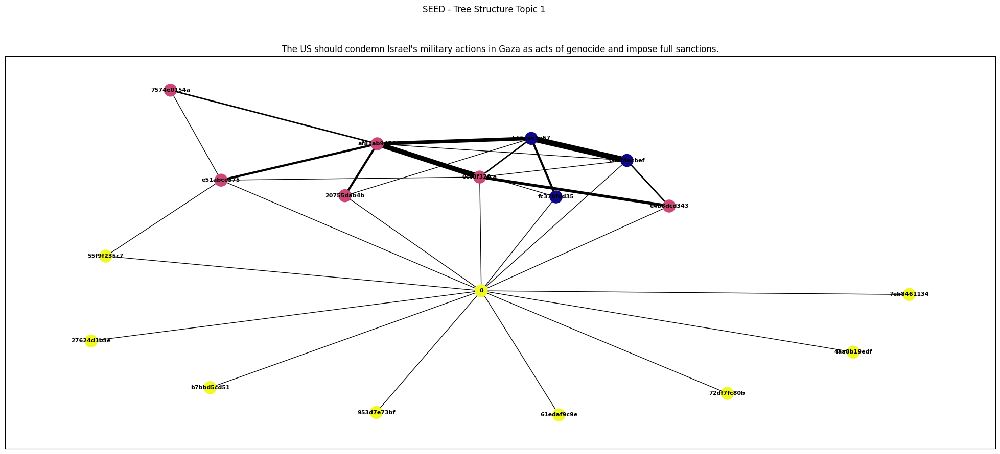

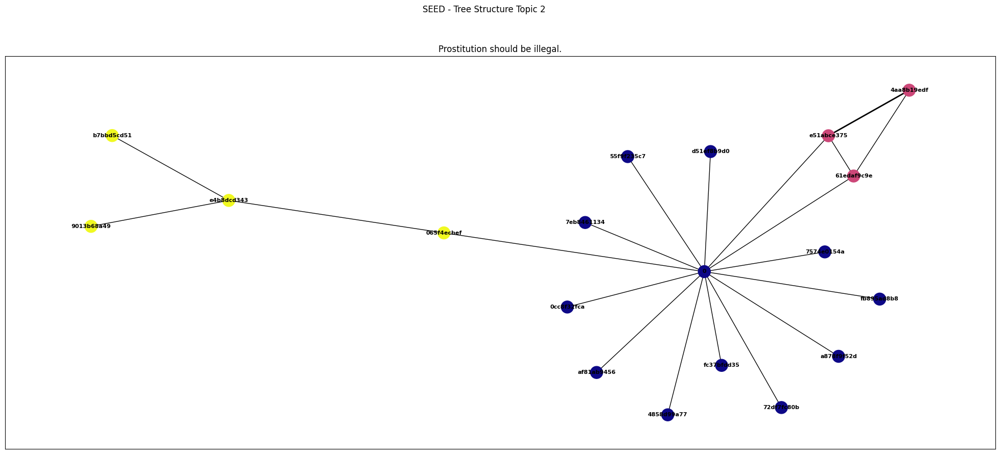

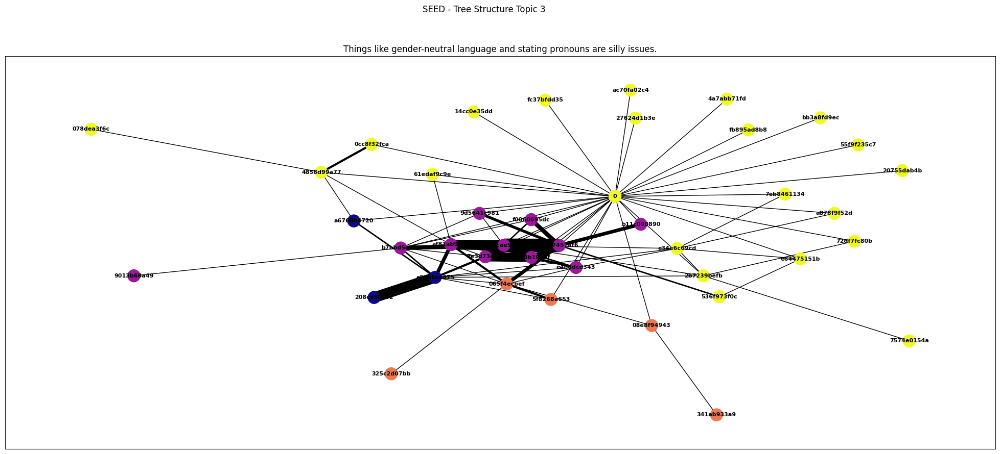

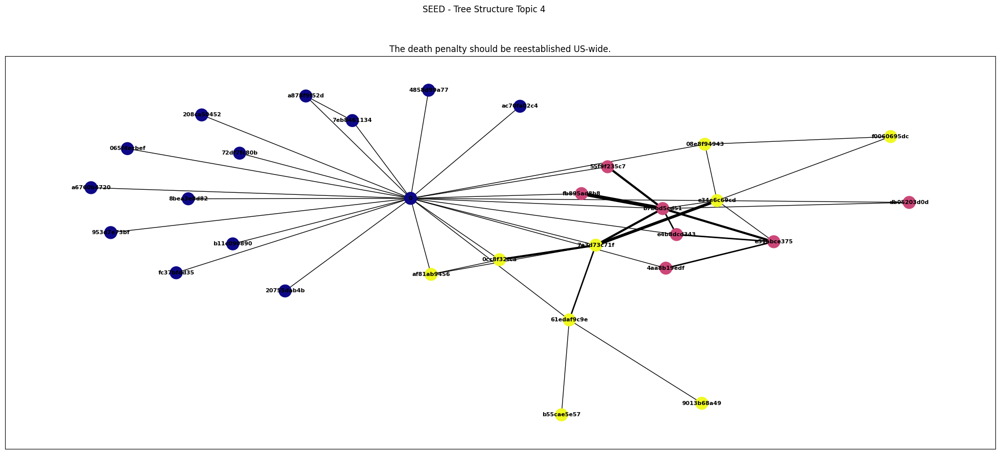

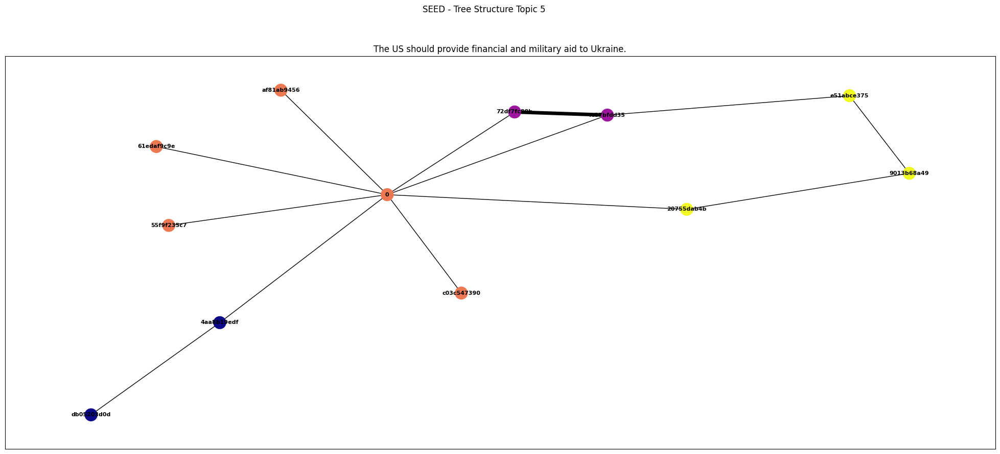

...

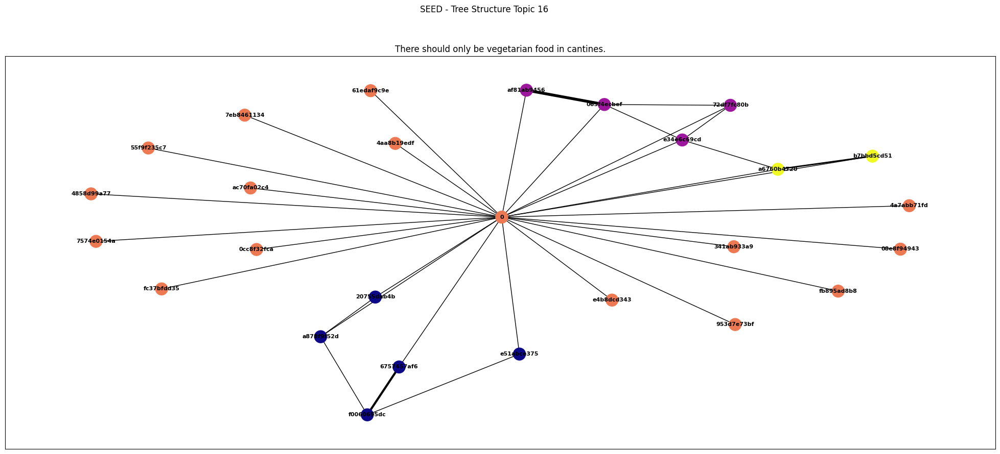

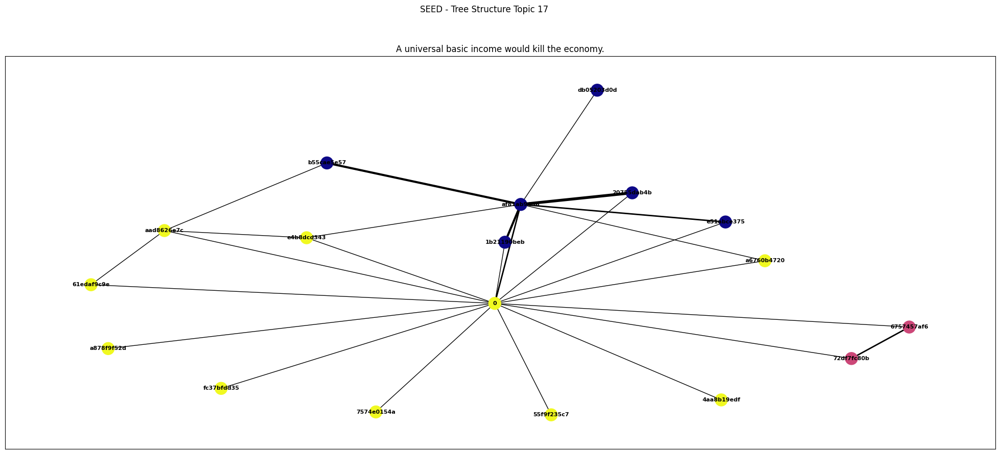

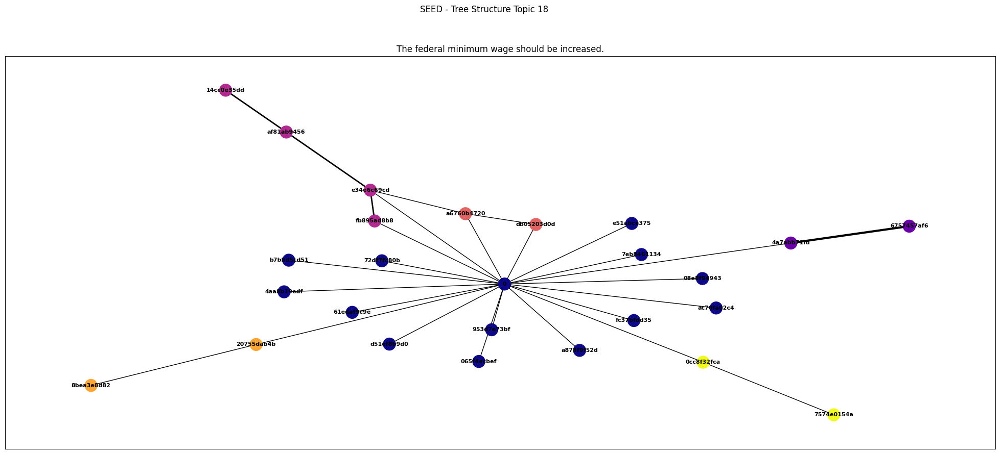

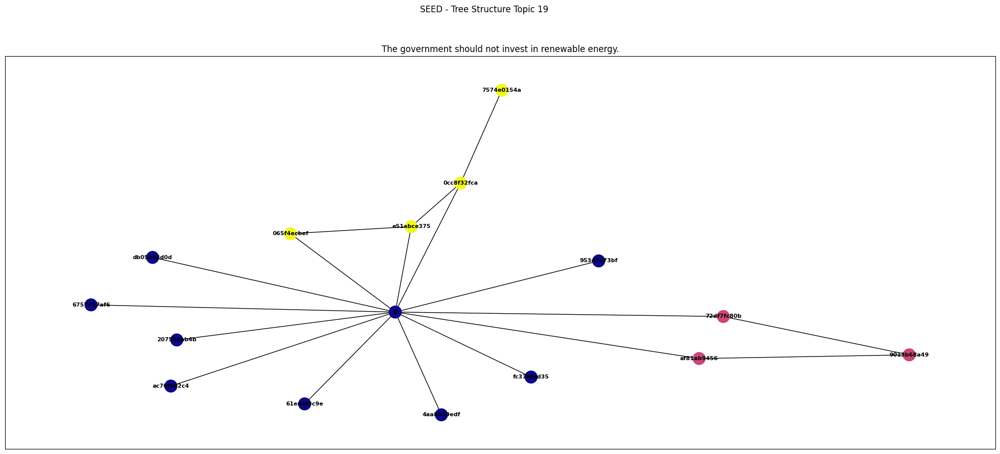

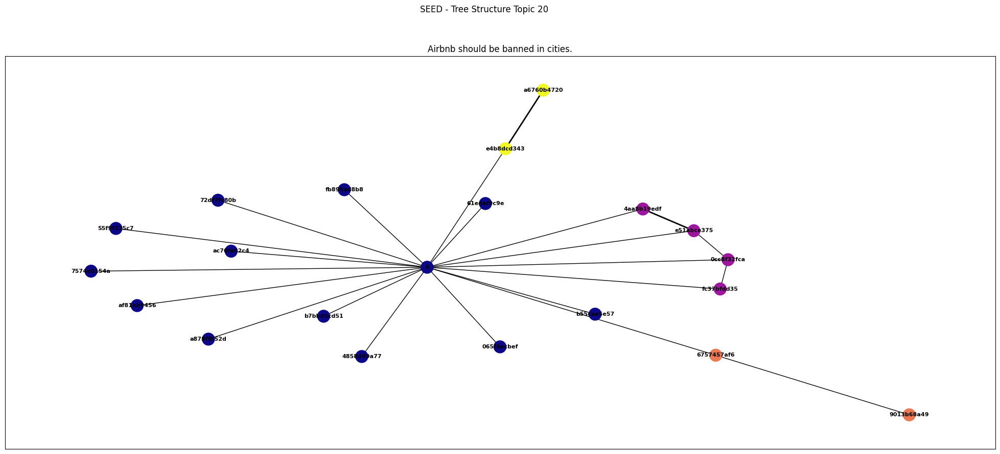

In [34]:
seed_communities = {}
for i in simulated_conditions:
    temp = discussions_data[discussions_data["subreddit"] == i].sort_values("topic")
    seed_communities[i] = visualize_user_network(temp, data_type="seed", plot=(True if i == 1 else False))

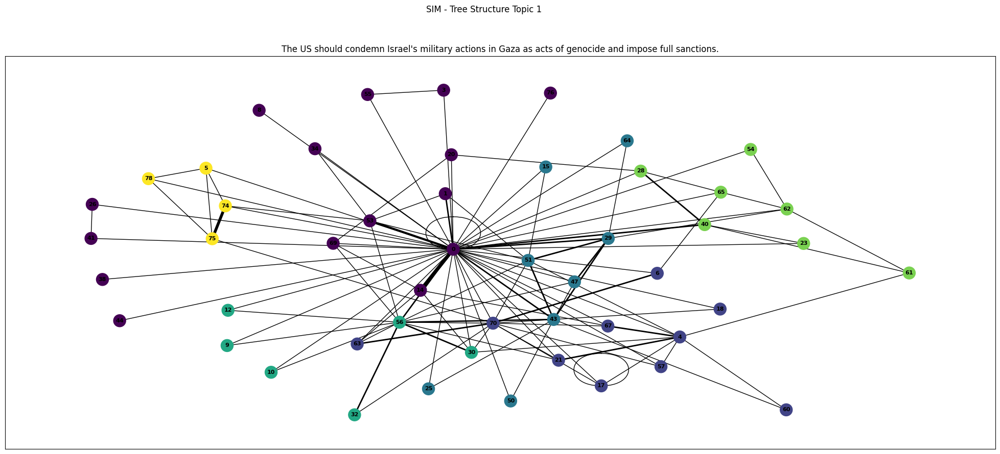

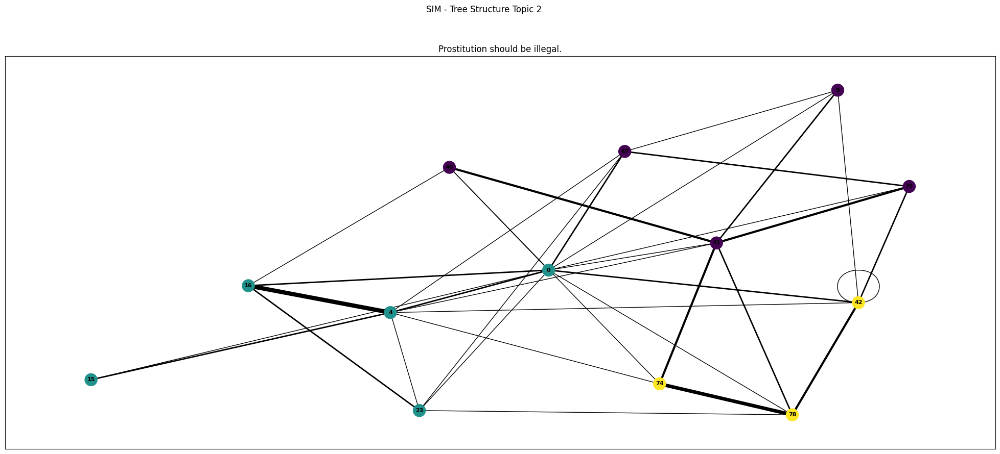

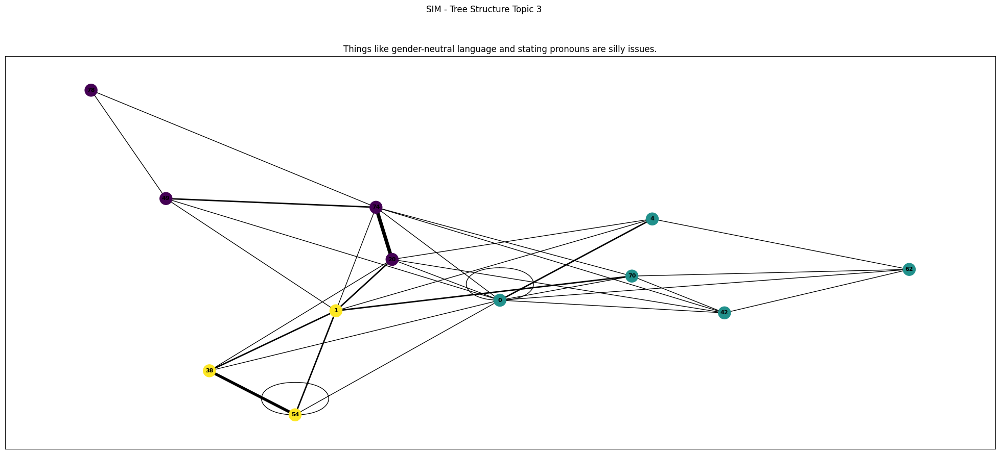

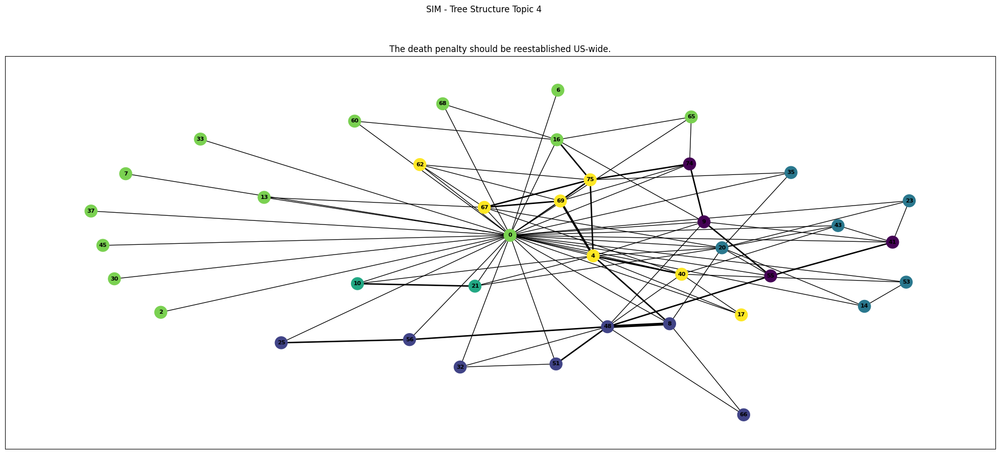

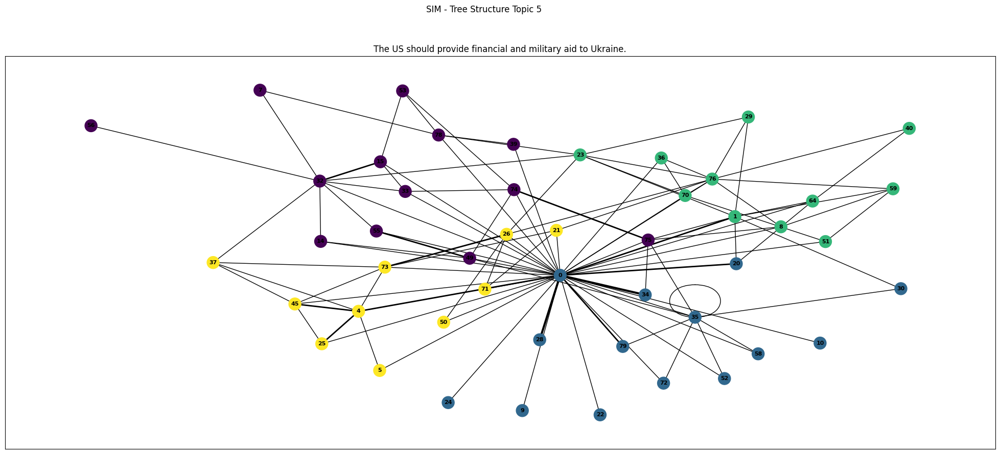

...

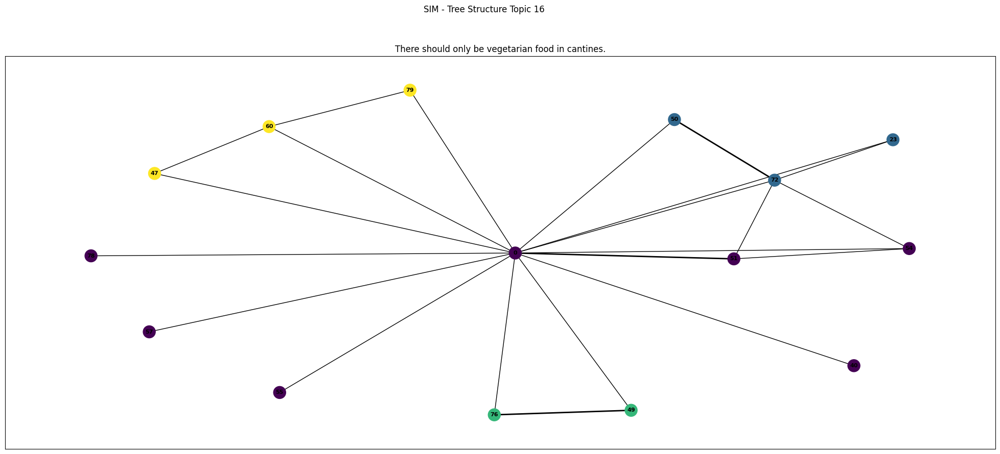

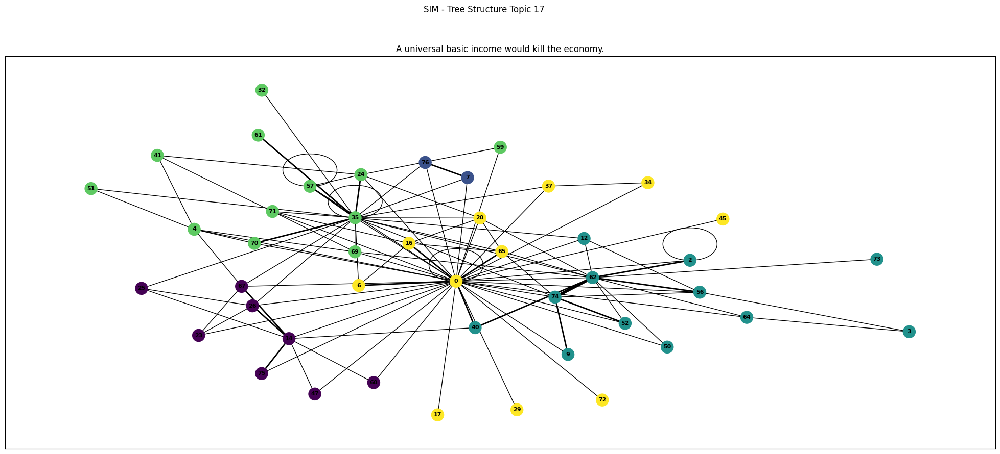

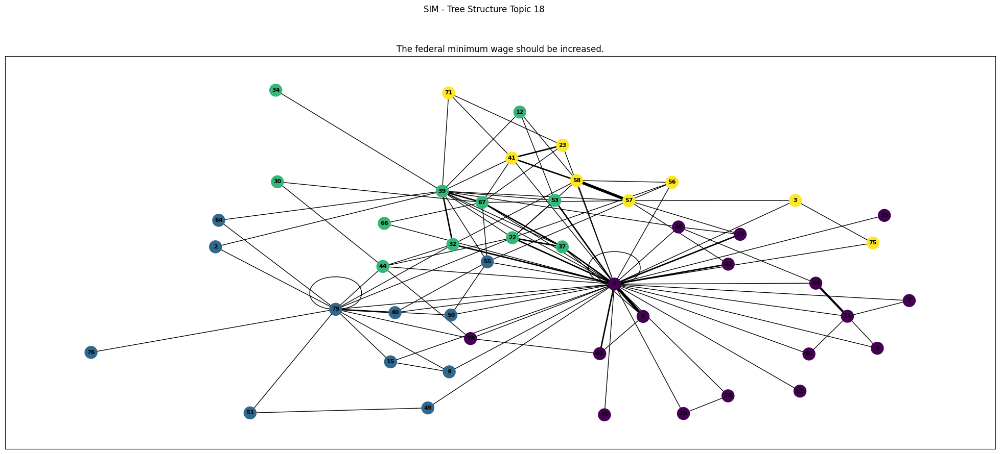

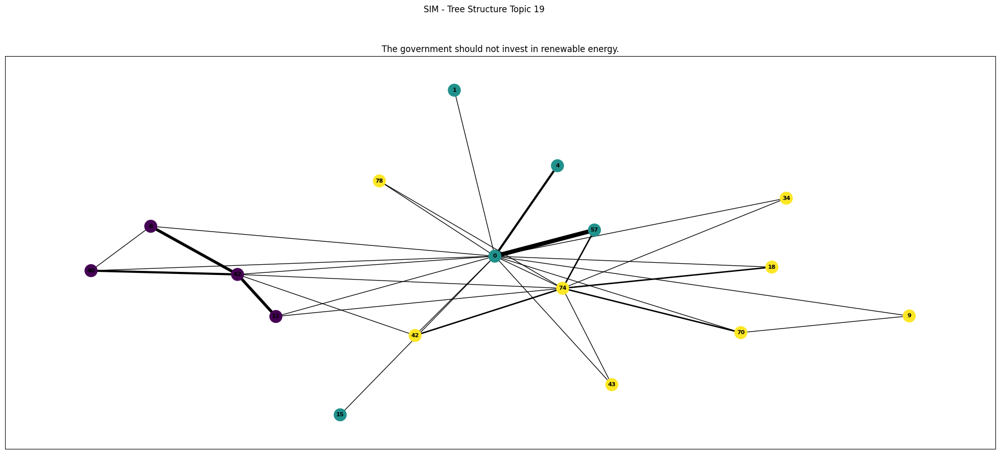

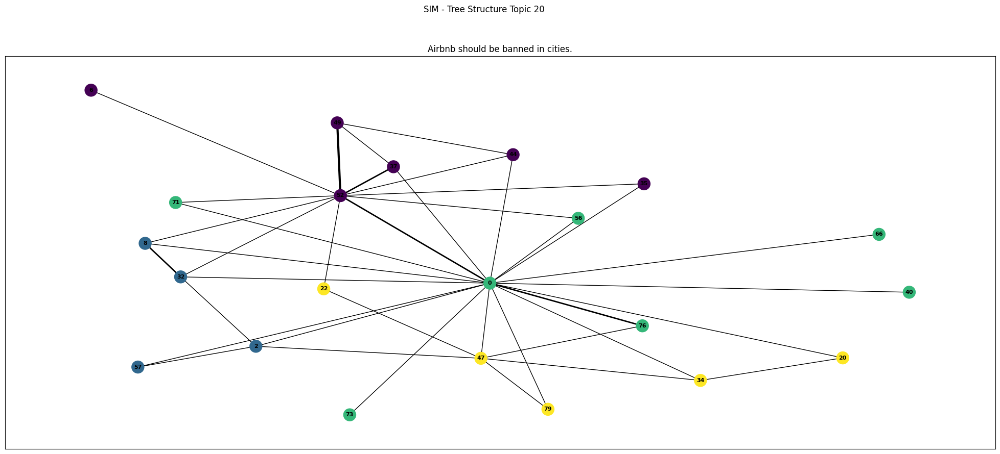

In [35]:
sim_communities = []
k = 0
for r in sim_discussions_dfs:
    run_dict = {}
    for i in simulated_conditions:
        temp = r[r["subreddit"] == i]
        run_dict[i] = visualize_user_network(temp, data_type="sim", plot=(True if k == 0 else False))
        k += 1
    sim_communities.append(run_dict)

In [36]:
# Summary of interaction network
for i in simulated_conditions:

    temp = seed_communities[i]["transitivity"]
    seed_mean_transitivity = round_mean(temp), get_ci(temp)
    seed_median_transitivity = round_mean(temp, "median"), get_ci(temp, "median")

    temp = seed_communities[i]["average_clustering"]
    seed_mean_clustering = round_mean(temp), get_ci(temp)
    seed_median_clustering = round_mean(temp, "median"), get_ci(temp, "median")

    temp = seed_communities[i]["n_communities"]
    seed_mean_n_communities = round_mean(temp), get_ci(temp)
    seed_median_n_communities = round_mean(temp, "median"), get_ci(temp, "median")

    # temp = [r[i]["transitivity"] for j in sim_communities for r in j]
    temp = [j for k in [r[i]["transitivity"] for r in sim_communities] for j in k]
    sim_mean_transitivity = round_mean(temp), get_ci(temp)
    sim_median_transitivity = round_mean(temp, "median"), get_ci(temp, "median")

    temp = [j for k in [r[i]["average_clustering"] for r in sim_communities] for j in k]
    sim_mean_clustering = round_mean(temp), get_ci(temp)
    sim_median_clustering = round_mean(temp, "median"), get_ci(temp, "median")

    temp = [j for k in [r[i]["n_communities"] for r in sim_communities] for j in k]
    sim_mean_n_communities = round_mean(temp), get_ci(temp)
    sim_median_n_communities = round_mean(temp, "median"), get_ci(temp, "median")

    print("#"*80)
    print("{:^80}".format(f"Subreddit {i}"))
    print("#"*80)
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Interaction Network", "Seed", "CI", "Sim", "CI"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Mean Transitivity", seed_mean_transitivity[0], f"{seed_mean_transitivity[1]}", sim_mean_transitivity[0], f"{sim_mean_transitivity[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Transitivity", seed_median_transitivity[0], f"{seed_median_transitivity[1]}", sim_median_transitivity[0], f"{sim_median_transitivity[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Mean Clustering", seed_mean_clustering[0], f"{seed_mean_clustering[1]}", sim_mean_clustering[0], f"{sim_mean_clustering[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Clustering", seed_median_clustering[0], f"{seed_median_clustering[1]}", sim_median_clustering[0], f"{sim_median_clustering[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Mean N Communities", seed_mean_n_communities[0], f"{seed_mean_n_communities[1]}", sim_mean_n_communities[0], f"{sim_mean_n_communities[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median N Communities", seed_median_n_communities[0], f"{seed_median_n_communities[1]}", sim_median_n_communities[0], f"{sim_median_n_communities[1]}"))

################################################################################
                                  Subreddit 1                                   
################################################################################
Interaction Network              Seed   CI             |   Sim    CI             
Mean Transitivity                0.12   (0.071, (0, 0.25))|  0.286   (0.141, (0.08207934336525308, 0.7731958762886598))
Median Transitivity             0.112   (0.071, (0, 0.25))|  0.234   (0.141, (0.08207934336525308, 0.7731958762886598))
Mean Clustering                 0.232   (0.128, (0.0, 0.5288156288156288))|  0.556   (0.094, (0.32659611992945325, 0.8416666666666667))
Median Clustering               0.237   (0.128, (0.0, 0.5288156288156288))|  0.542   (0.094, (0.32659611992945325, 0.8416666666666667))
Mean N Communities               3.65   (0.853, (2, 6))|   4.47   (1.153, (2, 7))
Median N Communities             4.0    (0.853, (2, 6))|   4.0    (1.153, (2, 7))

In [37]:
# Summary of interaction network
seed_transitivity = []
sim_transitivity = []

for i in simulated_conditions:
    seed_transitivity.extend(seed_communities[i]["transitivity"])

    temp = [j for k in [r[i]["transitivity"] for r in sim_communities] for j in k]
    sim_transitivity.extend(temp)

    
seed_mean_transitivity = round_mean(seed_transitivity), get_ci(seed_transitivity)
seed_median_transitivity = round_mean(seed_transitivity, "median"), get_ci(seed_transitivity, "median")

sim_mean_transitivity = round_mean(sim_transitivity), get_ci(sim_transitivity)
sim_median_transitivity = round_mean(sim_transitivity, "median"), get_ci(sim_transitivity, "median")

print("#"*80)
print("{:^80}".format(f"Control Condition"))
print("#"*80)
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Interaction Network", "Seed", "CI", "Sim", "CI"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Mean Transitivity", seed_mean_transitivity[0], f"{seed_mean_transitivity[1]}", sim_mean_transitivity[0], f"{sim_mean_transitivity[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Transitivity", seed_median_transitivity[0], f"{seed_median_transitivity[1]}", sim_median_transitivity[0], f"{sim_median_transitivity[1]}"))

################################################################################
                               Control Condition                                
################################################################################
Interaction Network              Seed   CI             |   Sim    CI             
Mean Transitivity               0.098   (0.065, (0, 0.25))|  0.255   (0.139, (0, 0.7731958762886598))
Median Transitivity             0.087   (0.065, (0, 0.25))|   0.21   (0.139, (0, 0.7731958762886598))


In [38]:
# Summary of interaction network
seed_transitivity = []
sim_transitivity = []

for i in simulated_conditions:
    seed_transitivity.extend(seed_communities[i]["transitivity"])

for r in sim_communities:
    temp = []
    temp.extend(r[1]["transitivity"])
    temp.extend(r[6]["transitivity"])
    sim_transitivity.append(temp)

temp_mean = []
temp_median = []

for i in sim_transitivity:
    temp_mean.extend([np.mean(i)])
    temp_median.extend([np.median(i)])

    
seed_mean_transitivity = round_mean(seed_transitivity), get_ci(seed_transitivity)
seed_median_transitivity = round_mean(seed_transitivity, "median"), get_ci(seed_transitivity, "median")

sim_mean_transitivity = round_mean(temp_mean), get_ci(temp_mean)
sim_median_transitivity = round_mean(temp_median, "median"), get_ci(temp_median, "median")

print("#"*80)
print("{:^80}".format(f"Control Condition"))
print("#"*80)
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Interaction Network", "Seed", "CI", "Sim", "CI"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Mean Transitivity", seed_mean_transitivity[0], f"{seed_mean_transitivity[1]}", sim_mean_transitivity[0], f"{sim_mean_transitivity[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Transitivity", seed_median_transitivity[0], f"{seed_median_transitivity[1]}", sim_median_transitivity[0], f"{sim_median_transitivity[1]}"))

################################################################################
                               Control Condition                                
################################################################################
Interaction Network              Seed   CI             |   Sim    CI             
Mean Transitivity               0.098   (0.065, (0, 0.25))|  0.255   (0.011, (0.2370327316197182, 0.2695593540032085))
Median Transitivity             0.087   (0.065, (0, 0.25))|  0.209   (0.012, (0.1996161661774667, 0.23855385983108607))


In [39]:
# ttest diff of means transitivity sim seed
temp = []
for i in temp_mean:
    temp.append(scipy.stats.ttest_ind(seed_transitivity, i)[1])

print(round_mean(temp), get_ci(temp))

0.024 (0.01, (0.013484541758931518, 0.04248433601872198))


In [40]:
seed_weights = []
sim_weights = []

for i in simulated_conditions:
    [seed_weights.extend(j) for j in seed_communities[i]["edge_weights"]]

for i in simulated_conditions:
    [sim_weights.extend(j) for j in [r[i]["edge_weights"] for r in sim_communities]]

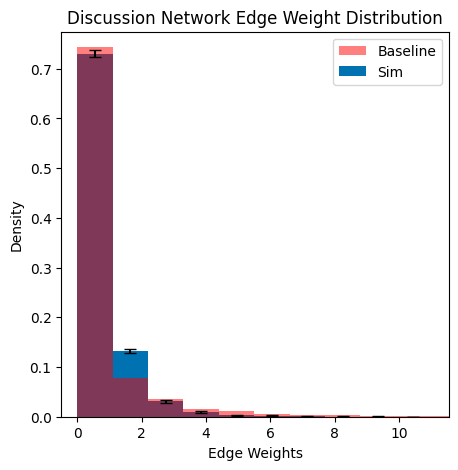

In [41]:
fig, ax = plt.subplots(1, 1, figsize=figsize_regular)

# ax.hist(sim_weights, density=True, label="Sim")
ax, bw = plot_multirun_hist_a(sim_weights, ax=ax, density=True, bins=10)
ax.hist(seed_weights, density=True, bins=binner(seed_weights, bw), color="r", alpha=0.5, label="Baseline")

ax.set_xlim(-0.5, )
ax.set_xlabel("Edge Weights")
ax.set_ylabel("Density")
ax.set_title("Discussion Network Edge Weight Distribution")


# ax.set_xticks(range(20))
ax.legend()
if save_figs:
    plt.savefig("figures/seed-sim_dist_edge-weights.pdf")
plt.show()

In [42]:
def get_n_replies(data, data_type):
    if data_type == "seed":
        parent_id_col = "parent_id"
        user_id_col = "ParticipantID"
        comment_id_col = "comment_id"
        topic_id_col = "post_id"
        post_ids = list(data[topic_id_col].unique())
    elif data_type == "sim":
        parent_id_col = "parent_comment_id"
        user_id_col = "user_id"
        comment_id_col = "comment_id"
        topic_id_col = "post_id"
        post_ids = [-1]
    else:
        raise ValueError("Enter valid data type")
    
    temp = data.set_index(comment_id_col)
    
    replies = 0
    n_missing_links = 0
    
    for i, r in temp.iterrows():
    
        try:
            if r[parent_id_col] not in post_ids:
                parent = r[parent_id_col]
                user = r[user_id_col]
        
                if temp.at[parent, user_id_col] != user:
                    sup_parent = temp.at[parent, parent_id_col]
        
                    if sup_parent not in post_ids:
                        if temp.at[sup_parent, user_id_col] == user:
                            replies += 1
        except:
            n_missing_links += 1
    
    return replies, n_missing_links

In [43]:
seed_n_replies = []
seed_n_missing_links = []

for i in simulated_conditions:
    sub_temp = discussions_data[discussions_data["subreddit"] == i].sort_values("topic")
    topics = list(discussions_data["topic"].unique())
    topics.sort()
    for j in topics:
        topic_temp = sub_temp[sub_temp["topic"] == j]
        topic_data = get_n_replies(topic_temp, "seed")

        # print(topic_data)
        seed_n_replies.append(topic_data[0])
        seed_n_missing_links.append(topic_data[1])

In [44]:
sim_n_replies = []
sim_n_missing_links = []

for i in simulated_conditions:
    sub_temp = [r[r["subreddit"] == i].sort_values("topic") for r in sim_discussions_dfs]
    topics = list(sim_discussions_data["topic"].unique())
    topics.sort()
    for j in topics:
        topic_temp = [r[r["topic"] == j] for r in sub_temp]
        topic_data = [get_n_replies(r, "sim") for r in topic_temp]

        # print(topic_data)
        [sim_n_replies.append(r[0]) for r in topic_data]
        [sim_n_missing_links.append(r[1]) for r in topic_data]

In [45]:
# Summary of reply patterns

temp = [seed_n_replies[i] + seed_n_replies[i+20] for i in range(len(seed_n_replies)//2)]
seed_mean_n_replies = round_mean(temp), get_ci(temp)
seed_median_n_replies = round_mean(temp, "median"), get_ci(temp, "median")

temp = [sim_n_replies[i] + sim_n_replies[i+20] for i in range(len(sim_n_replies)//2)]
sim_mean_n_replies = round_mean(temp), get_ci(temp)
sim_median_n_replies = round_mean(temp, "median"), get_ci(temp, "median")

print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Interaction Network", "Seed", "CI", "Sim", "CI"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Mean N Replies", seed_mean_n_replies[0], f"{seed_mean_n_replies[1]}", sim_mean_n_replies[0], f"{sim_mean_n_replies[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median N Replies", seed_median_n_replies[0], f"{seed_median_n_replies[1]}", sim_median_n_replies[0], f"{sim_median_n_replies[1]}"))

subs_seed = []
subs_sim = []

for i, j in zip(range(len(simulated_conditions)), simulated_conditions):

    bounds = list(range(0, len(seed_n_replies)+1, 20))
    temp = seed_n_replies[bounds[i]:bounds[i+1]]
    subs_seed.append(temp)
    seed_mean_n_replies_sub = round_mean(temp), get_ci(temp)
    seed_median_n_replies_sub = round_mean(temp, "median"), get_ci(temp, "median")
    
    bounds = list(range(0, len(sim_n_replies)+1, 20))
    temp = [j for k in [sim_n_replies[bounds[i+r]:bounds[i+1+r]] for r in range(0, 10)] for j in k]
    subs_sim.append(temp)
    sim_mean_n_replies_sub = round_mean(temp), get_ci(temp)
    sim_median_n_replies_sub = round_mean(temp, "median"), get_ci(temp, "median")

    print("#"*80)
    print("{:^80}".format(f"Subreddit {j}"))
    print("#"*80)
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Interaction Network", "Seed", "CI", "Sim", "CI"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Mean N Replies", seed_mean_n_replies_sub[0], f"{seed_mean_n_replies_sub[1]}", sim_mean_n_replies_sub[0], f"{sim_mean_n_replies_sub[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median N Replies", seed_median_n_replies_sub[0], f"{seed_median_n_replies_sub[1]}", sim_median_n_replies_sub[0], f"{sim_median_n_replies_sub[1]}"))

Interaction Network              Seed   CI             |   Sim    CI             
Mean N Replies                   28.3   (24.924, (2, 122))|  11.54   (3.997, (5, 25))
Median N Replies                 23.5   (24.924, (2, 122))|   11.0   (3.997, (5, 25))
################################################################################
                                  Subreddit 1                                   
################################################################################
Interaction Network              Seed   CI             |   Sim    CI             
Mean N Replies                  16.45   (26.016, (0, 117))|  5.765   (2.805, (0, 17))
Median N Replies                 6.0    (26.016, (0, 117))|   6.0    (2.805, (0, 17))
################################################################################
                                  Subreddit 6                                   
################################################################################
Intera

In [46]:
# reply difference of means Baseline subs
scipy.stats.ttest_ind(subs_seed[0], subs_seed[1])

TtestResult(statistic=0.7236789384208724, pvalue=0.47369453823003993, df=38.0)

In [47]:
# reply difference of means sim subs
temp_eff = []
temp_ps = []

for i in range(0, 10):
    temp = scipy.stats.ttest_ind(subs_sim[0][i*20:i*20+20], subs_sim[1][i*20:i*20+20])
    temp_eff.append(temp[0])
    temp_ps.append(temp[1])

print(round_mean(temp_eff), get_ci(temp_eff))
print(round_mean(temp_ps), get_ci(temp_ps))

0.018 (1.459, (-2.0827624788676684, 2.530701794778011))
0.323 (0.237, (0.01564547153287893, 0.7298178341721158))


In [48]:
np.mean([seed_n_replies[i] + seed_n_replies[i+20] for i in range(20)])

28.3

In [168]:
# Reply statistics per topic for Baseline and simulated data
sim_replies_per_topic = []
for i in range(0, 20):
    t = sim_n_replies[i*10:(i+1)*10]
    u = sim_n_replies[i*10+200:(i+1)*10+200]
    sim_replies_per_topic.append([i+j for i, j in zip(t, u)])

sim_replies_per_topic_avg = [round_mean(i) for i in sim_replies_per_topic]
sim_replies_per_topic_ci = [get_ci(i) for i in sim_replies_per_topic]

seed_replies_per_topic = []
for i in range(0, 20):
    t = [seed_n_replies[i*1]]
    u = [seed_n_replies[i*1+10]]
    seed_replies_per_topic.extend(i+j for i,j in zip(t, u))

temp = scipy.stats.pearsonr(seed_replies_per_topic, sim_replies_per_topic_avg)
print(f"Correlation: Baseline/simulated replies per topic: {temp[0]} (p={temp[1]})")
print()

for i in range(20):
    topic = discussions_data[discussions_data["topic"] == i+1]["post_title"].iloc[0]
    # print("{:<110}{:^10}{:^10}{:<20}".format(topic, seed_replies_per_topic[i], sim_replies_per_topic_avg[i], f"{sim_replies_per_topic_ci[i][0]}"))
    print("{:<110}{:^10}{:^10}{:<20}".format(topic, "", "", f"{round(sim_replies_per_topic_ci[i][0], 0)}"))

print()
temp = scipy.stats.pearsonr(seed_replies_per_topic, seed_volume_per_topic)
print(f"Correlation: Volume/replies per topic (Baseline): {temp[0]} (p={temp[1]})")
temp = scipy.stats.pearsonr(sim_replies_per_topic_avg, [round_mean(i) for i in sim_volume_per_topic])
print(f"Correlation: Volume/replies per topic (simulation): {temp[0]} (p={temp[1]})")

Correlation: Baseline/simulated replies per topic: 0.32523435381884613 (p=0.16174600175676004)

The US should condemn Israel's military actions in Gaza as acts of genocide and impose full sanctions.                            3.0                 
Prostitution should be illegal.                                                                                                   4.0                 
Things like gender-neutral language and stating pronouns are silly issues.                                                        5.0                 
The death penalty should be reestablished US-wide.                                                                                4.0                 
The US should provide financial and military aid to Ukraine.                                                                      3.0                 
We need stricter gun control laws.                                                                                                3.0                

In [50]:
# mean median self-replies per topic for seed data
temp_seed = [i+j for i, j in zip(seed_communities[1]["self_replies"], seed_communities[6]["self_replies"])]
print(round_mean(temp_seed), get_ci(temp_seed))
print(round_mean(temp_seed, "median"), get_ci(temp_seed, "median"))

0.15 (0.477, (0, 2))
0.0 (0.477, (0, 2))


In [51]:
# mean median self-replies over all topics for sim data
runs = []
for r in sim_communities:
    runs.append([i+j for i, j in zip(r[1]["self_replies"], r[6]["self_replies"])])

temp_mean = []
temp_median = []
for i in runs:
    temp_mean.append(np.mean(i))
    temp_median.append(np.median(i))

print(round_mean(temp_mean), get_ci([temp_mean]))
print(round_mean(temp_median, "median"), get_ci(temp_median, "median"))

3.95 (0.451, ([3.9, 3.85, 3.95, 3.9, 3.55, 3.6, 4.15, 4.95, 4.4, 3.25], [3.9, 3.85, 3.95, 3.9, 3.55, 3.6, 4.15, 4.95, 4.4, 3.25]))
4.0 (0.391, (3.0, 4.5))


In [52]:
# difference of mean self-replies sim seed
temp_ps = []

for i in runs:
    temp_ps.append(scipy.stats.ttest_ind(temp_seed, i)[1])

print(round_mean(temp_ps), get_ci(temp_ps))

0.0 (0.0, (1.1665171049656034e-10, 9.773794117199893e-09))


In [53]:
seed_x = []
seed_y = []

temp = discussions_data.set_index("comment_id")

for i, r in temp.iterrows():
    if r["parent_id"] in temp.index:
        seed_x.append(r["length_comment_char"])
        seed_y.append(temp.at[r["parent_id"], "length_comment_char"])

In [54]:
sim_x = []
sim_y = []

for run in sim_discussions_dfs:
    run_x = []
    run_y = []
    for i in simulated_conditions:
        for j in range(1, 21):
    
            temp = run[run["subreddit"] == i]
            temp = temp[temp["topic"] == j]
            temp = temp.set_index("comment_id")
            
            for x, r in temp.iterrows():
                if r["parent_comment_id"] in temp.index:
                    run_x.append(r["sim_comment_length"])
                    run_y.append(temp.at[r["parent_comment_id"], "sim_comment_length"])
    sim_x.append(run_x)
    sim_y.append(run_y)

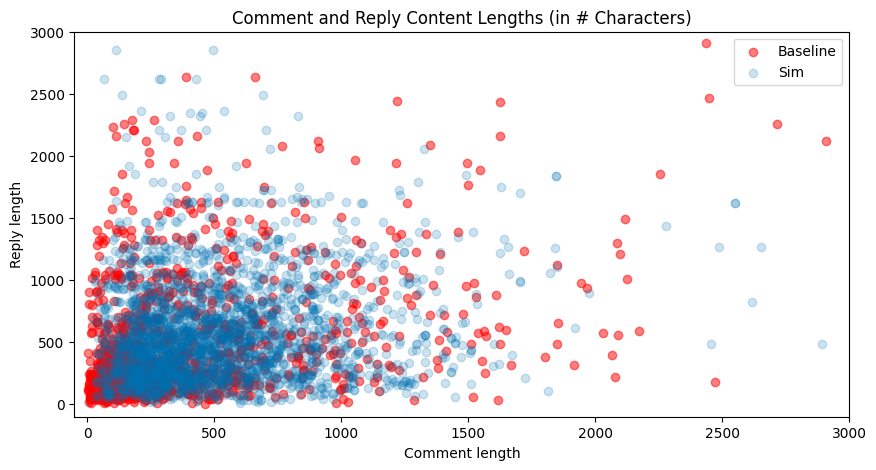

In [55]:
fig, ax = plt.subplots(1, 1, figsize=figsize_wide)

ax.scatter(seed_x, seed_y, alpha=0.5, color="r", label="Baseline")
ax.scatter(sim_x[0], sim_y[0], alpha=0.2, label="Sim")

# ax[0].scatter(sim_x[0], sim_y[0], alpha=0.5, label="Sim")
# ax[1].scatter(seed_x, seed_y, alpha=0.2, color="r", label="Baseline")

# ax[0].set_xlim(-200, 4000)
# ax[0].set_ylim(-250, 5500)
ax.set_xlim(-50, 3000)
ax.set_ylim(-100, 3000)
ax.set_xlabel("Comment length")
ax.set_ylabel("Reply length")
ax.set_title("Comment and Reply Content Lengths (in # Characters)")

ax.legend()
if save_figs:
    plt.savefig("figures/seed-sim_scatter_parent-reply-comment-length.pdf")
plt.show()

In [56]:
seed_parent_reply_length_corr = scipy.stats.pearsonr(seed_x, seed_y)

sim_parent_reply_length_corr = [[], []]
for i in range(len(sim_discussions_dfs)):
    temp = scipy.stats.pearsonr(sim_x[i], sim_y[i])
    sim_parent_reply_length_corr[0].append(temp[0])
    sim_parent_reply_length_corr[1].append(temp[1])

seed_r = round(seed_parent_reply_length_corr[0], 3)
seed_p = round(seed_parent_reply_length_corr[1], 3)

sim_r = round_mean(sim_parent_reply_length_corr[0], digits=3), get_ci(sim_parent_reply_length_corr[0], digits=3)
sim_p = round_mean(sim_parent_reply_length_corr[1], digits=3), get_ci(sim_parent_reply_length_corr[1], digits=3)

print("-"*80)
print("{:<30}{:^10}|{:^40}".format("Parent-Reply Length", "Seed", "Sim"))
print("-"*80)
print("{:<30}{:^5}{:^5}|{:^5}{:^15}{:^5}{:^15}".format("", "Coef", "p", "Coef", "CI", "p", "CI"))
print("{:<30}{:^5}{:^5}|{:^5}{:^15}{:^5}{:^15}".format("Pearson r", seed_r, seed_p, sim_r[0], f"{sim_r[1]}", sim_p[0], f"{sim_p[1]}"))

--------------------------------------------------------------------------------
Parent-Reply Length              Seed   |                  Sim                   
--------------------------------------------------------------------------------
                              Coef   p  |Coef       CI         p        CI       
Pearson r                     0.331 0.0 |0.195(0.04, (0.1343686207608614, 0.2614401867361338)) 0.0 (0.0, (1.248844523020173e-41, 1.495022830166123e-11))


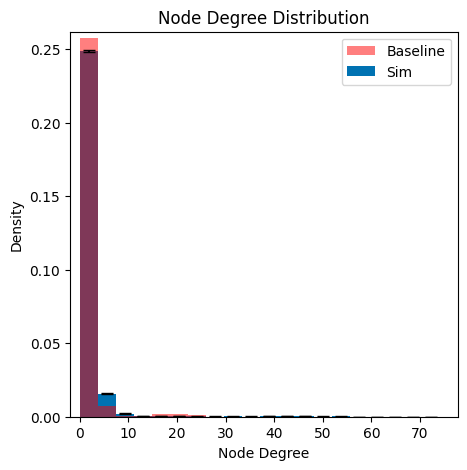

In [57]:
# subs together but runs separate
seed_temp = []
sim_temp = []

for i in simulated_conditions:
    seed_temp.extend([j for k in seed_network[i]["degrees"] for j in k])
for i in sim_network:
    temp = []
    for j in simulated_conditions:
        temp.extend([k for l in i[j]["degrees"] for k in l])
    sim_temp.append(temp)


fig, ax = plt.subplots(1, 1, figsize=figsize_regular)
# plt.hist(sim_temp, density=True, label="Sim", bins=20)
_, bw = plot_multirun_hist_a(sim_temp, density=True, ax=ax, bins=20)
ax.hist(seed_temp, density=True, color="r", alpha=0.5, label="Baseline", bins=binner(seed_temp, bw))
ax.set_xlabel("Node Degree")
ax.set_ylabel("Density")
ax.set_xlim(-2,)
ax.legend()
ax.set_title("Node Degree Distribution")
if save_figs:
    plt.savefig("figures/seed-sim_dist_node-degrees.pdf")
plt.show()

In [58]:
def extract_run_network(x, mode="seed"):
    sim_temp = []
    seed_temp = []

    if mode == "seed":
        for i in simulated_conditions:
            seed_temp.extend(seed_network[i][x])
        return seed_temp
    
    elif mode == "sim":
        for i in sim_network:
            temp = []
            for j in simulated_conditions:
                temp.extend(i[j][x])
            sim_temp.append(temp)
        return sim_temp

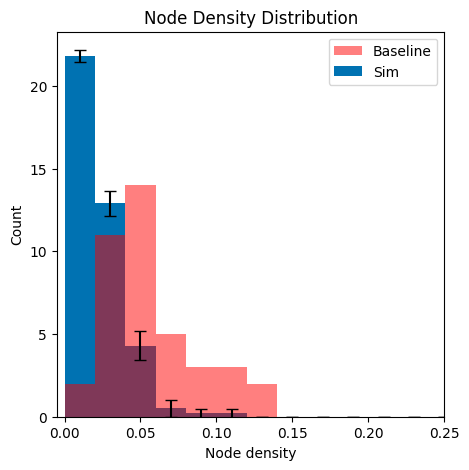

In [59]:
fig, ax = plt.subplots(1, 1, figsize=figsize_regular)

_, bw = plot_multirun_hist_a(extract_run_network("density", mode="sim"), ax=ax, bins=100)
temp = extract_run_network("density")
ax.hist(temp, color="r", alpha=0.5, label="Baseline", bins=binner(temp, bw))
ax.set_xlabel("Node density")
ax.set_ylabel("Count")
ax.set_xlim(-0.005, 0.25)
ax.legend()
ax.set_title("Node Density Distribution")
if save_figs:
    plt.savefig("figures/seed-sim_dist_node-density.pdf")
plt.show()

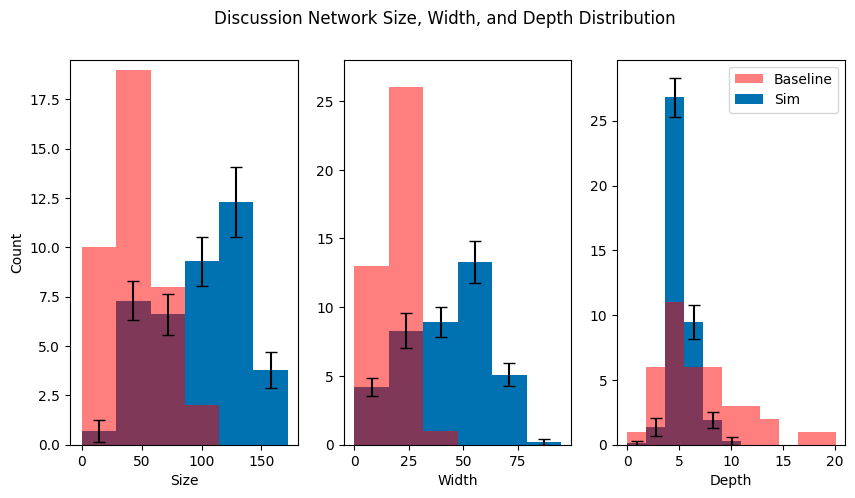

In [60]:
# Plot simulation descriptives
bins = 6
fig, axs = plt.subplots(1, 3, figsize=figsize_wide)

_, bw = plot_multirun_hist_a(extract_run_network("size", mode="sim"), ax=axs[0], bins=bins)
temp = extract_run_network("size")
axs[0].hist(temp, color="r", alpha=0.5, label="Baseline", bins=binner(temp, bw))
axs[0].set_xlabel("Size")
axs[0].set_ylabel("Count")
axs[0].set_xlim(-10,)
axs[0].set_ylim(0, 19.5)

_, bw = plot_multirun_hist_a(extract_run_network("width", mode="sim"), ax=axs[1], bins=bins)
temp = extract_run_network("width")
axs[1].hist(temp, color="r", alpha=0.5, label="Baseline", bins=binner(temp, bw))
axs[1].set_xlabel("Width")
axs[1].set_xlim(-5)
axs[1].set_ylim(0, 28)

_, bw = plot_multirun_hist_a(extract_run_network("depth", mode="sim"), ax=axs[2], bins=bins)
temp = extract_run_network("depth")
axs[2].hist(temp, color="r", alpha=0.5, label="Baseline", bins=binner(temp, bw))
axs[2].set_xlabel("Depth")
axs[2].set_xlim(-1, 21)
axs[2].legend()

plt.suptitle("Discussion Network Size, Width, and Depth Distribution")
if save_figs:
    plt.savefig("figures/seed-sim_dist_vol-width-depth.pdf")
plt.show()

In [61]:
# ttest sim seed size
temp = []
for i in extract_run_network("size", mode="sim"):
    temp.append(scipy.stats.ttest_ind(extract_run_network("size"), i)[1])
print(round_mean(temp), get_ci(temp))

0.0 (0.0, (3.411576111586492e-09, 1.3086350410774667e-07))


In [62]:
# ttest sim seed width
temp = []
for i in extract_run_network("width", mode="sim"):
    temp.append(scipy.stats.ttest_ind(extract_run_network("width"), i)[1])
print(round_mean(temp), get_ci(temp))

0.0 (0.0, (2.6806459187702607e-11, 1.0416149305199338e-09))


In [63]:
# ttest sim seed depth
temp = []
for i in extract_run_network("depth", mode="sim"):
    temp.append(scipy.stats.ttest_ind(extract_run_network("depth"), i)[1])
print(round_mean(temp), get_ci(temp))

0.002 (0.001, (0.0006854609650483874, 0.005506675499053926))


In [64]:
# correlation size and width seed
scipy.stats.pearsonr(extract_run_network("size"), extract_run_network("width"))

PearsonRResult(statistic=0.6410509104589441, pvalue=8.333380033776332e-06)

In [65]:
# correlation size and depth seed
scipy.stats.pearsonr(extract_run_network("size"), extract_run_network("depth"))

PearsonRResult(statistic=0.7666621331709006, pvalue=8.033428798212639e-09)

In [66]:
# correlation width and depth seed
scipy.stats.pearsonr(extract_run_network("width"), extract_run_network("depth"))

PearsonRResult(statistic=0.35080986339129605, pvalue=0.026457700906036583)

In [67]:
# correlation size and width sim
temp_coeff = []
temp_ps = []

x = extract_run_network("size", mode="sim")
y = extract_run_network("width", mode="sim")
for i in range(10):
    temp_coeff.append(scipy.stats.pearsonr(x[i], y[i])[0])
    temp_ps.append(scipy.stats.pearsonr(x[i], y[i])[1])
    
print(round_mean(temp_coeff), get_ci(temp_coeff))
print(round_mean(temp_ps), get_ci(temp_ps))

0.955 (0.012, (0.9373352836891757, 0.9742876736852093))
0.0 (0.0, (3.3528155919226825e-26, 5.446752843638722e-19))


In [68]:
# correlation size and width sim
temp_coeff = []
temp_ps = []

x = extract_run_network("size", mode="sim")
y = extract_run_network("depth", mode="sim")
for i in range(10):
    temp_coeff.append(scipy.stats.pearsonr(x[i], y[i])[0])
    temp_ps.append(scipy.stats.pearsonr(x[i], y[i])[1])
    
print(round_mean(temp_coeff), get_ci(temp_coeff))
print(round_mean(temp_ps), get_ci(temp_ps))

-0.249 (0.17, (-0.488287576563984, 0.08623651609361704))
0.214 (0.216, (0.0013909689293728372, 0.5967359838114575))


In [69]:
# correlation size and width sim
temp_coeff = []
temp_ps = []

x = extract_run_network("width", mode="sim")
y = extract_run_network("depth", mode="sim")
for i in range(10):
    temp_coeff.append(scipy.stats.pearsonr(x[i], y[i])[0])
    temp_ps.append(scipy.stats.pearsonr(x[i], y[i])[1])
    
print(round_mean(temp_coeff), get_ci(temp_coeff))
print(round_mean(temp_ps), get_ci(temp_ps))

-0.356 (0.169, (-0.5895963635516375, 0.0017079627032706851))
0.141 (0.29, (6.246104307029785e-05, 0.9916546266582748))


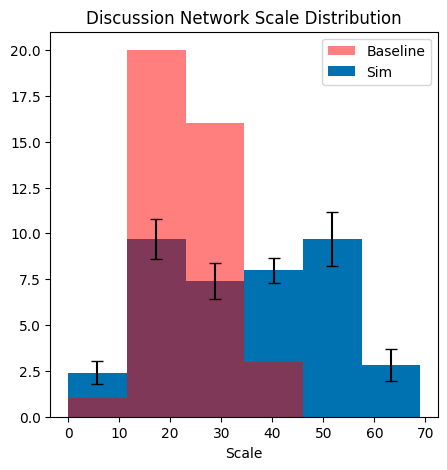

In [70]:
# Plot dist of scale across sim and seed threads
fig, ax = plt.subplots(1, 1, figsize=figsize_regular)

sim_temp = [r.groupby(["subreddit", "topic"]).nunique("seed_user_id") for r in sim_discussions_dfs]

_, bw = plot_multirun_hist_b("seed_user_id", sim_temp, ax=ax, bins=6)
ax.set_xlabel("Scale")

temp = discussions_data.groupby([
    "subreddit", "post_title"
]).nunique("ParticipantID")

ax.hist(temp["ParticipantID"], color="r", alpha=0.5, label="Baseline", bins=binner(temp["ParticipantID"], bw))
ax.set_xlabel("Scale")
ax.set_title("Discussion Network Scale Distribution")
ax.set_ylim(0, 21)

plt.legend()
if save_figs:
    plt.savefig("figures/seed-sim_dist_scale.pdf")
plt.show()

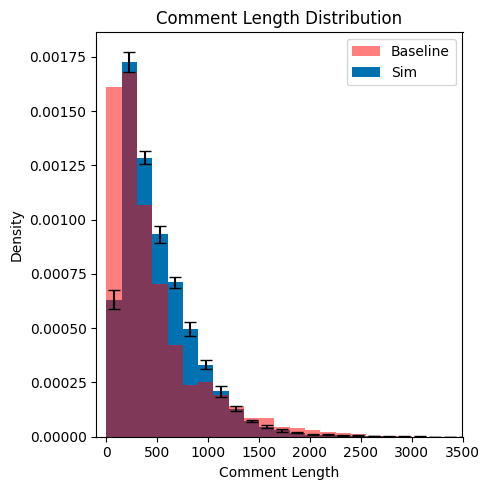

In [71]:
# Plot dist of comment lengths for all Sims
fig, ax = plt.subplots(1, 1, figsize=figsize_regular)

_, bw = plot_multirun_hist_b("sim_comment_length", ax=ax, bins=100, density=True)

temp = discussions_data[discussions_data["length_comment_char"] <= 3000]["length_comment_char"]
ax.hist(temp, color="r", alpha=0.5, bins=binner(temp, bw), label="Baseline", density=True)
ax.set_xlabel("Comment Length")
ax.set_xlim(-100, 3500)
ax.set_ylabel("Density")
ax.set_title("Comment Length Distribution")

plt.legend()
plt.tight_layout()
if save_figs:
    plt.savefig("figures/seed-sim_dist_comment-lengths.pdf")
plt.show()

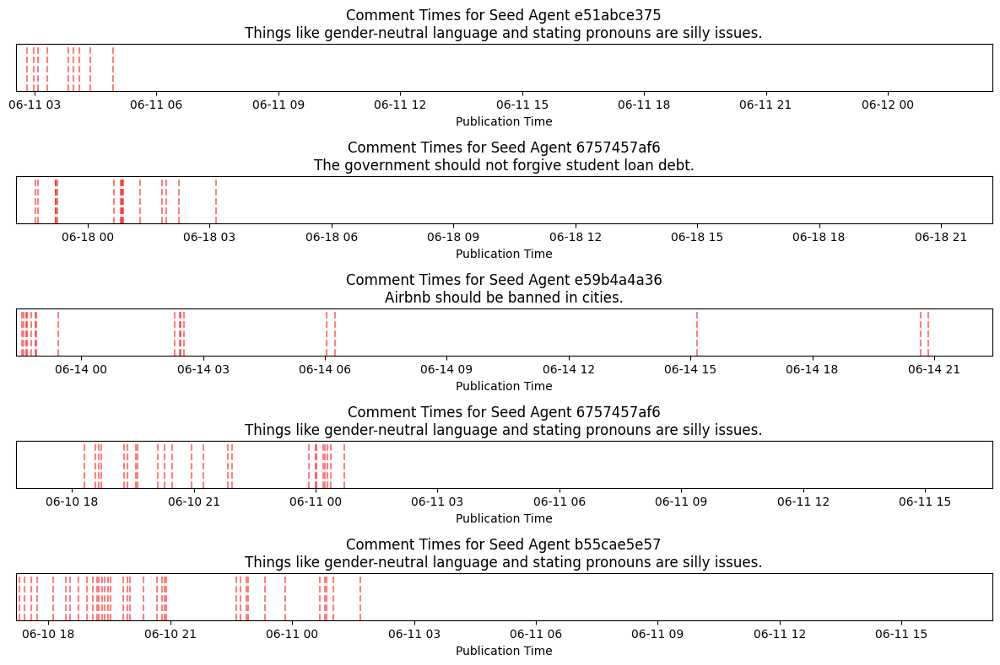

In [72]:
# Seed
temp = discussions_data.groupby(["ParticipantID", "post_title"]).size().sort_values().tail(5)

j = 0
fig, axs = plt.subplots(5, 1, figsize=(12, 8))
for i, r in temp.items():
    comments = discussions_data[
    discussions_data["ParticipantID"] == i[0]
    ]
    comments = comments[comments["post_title"] == i[1]][
    "created_comment"
    ]
    
    for comment in pd.to_datetime(comments):
        axs[j].axvline(x=comment, color="r", alpha=0.5, linestyle="--")
    
    # axs[j].set_xlim([pd.to_datetime(comments).min() - pd.Timedelta(minutes=1),
    #              pd.to_datetime(comments).max() + pd.Timedelta(minutes=1)])
    axs[j].set_xlim([pd.to_datetime(comments).min() - pd.Timedelta(minutes=1),
                 pd.to_datetime(comments).min() + pd.Timedelta(hours=24, minutes=1)])
    # axs[j].set_ylim([0, 0.9])
    axs[j].set_title(f"Comment Times for Seed Agent {i[0]}\n{i[1]}")
    axs[j].set_xlabel("Publication Time")

    axs[j].set_yticks([])

    j += 1

plt.tight_layout()
if save_figs:
    plt.savefig("figures/seed_burst-top-5.pdf")
plt.show()

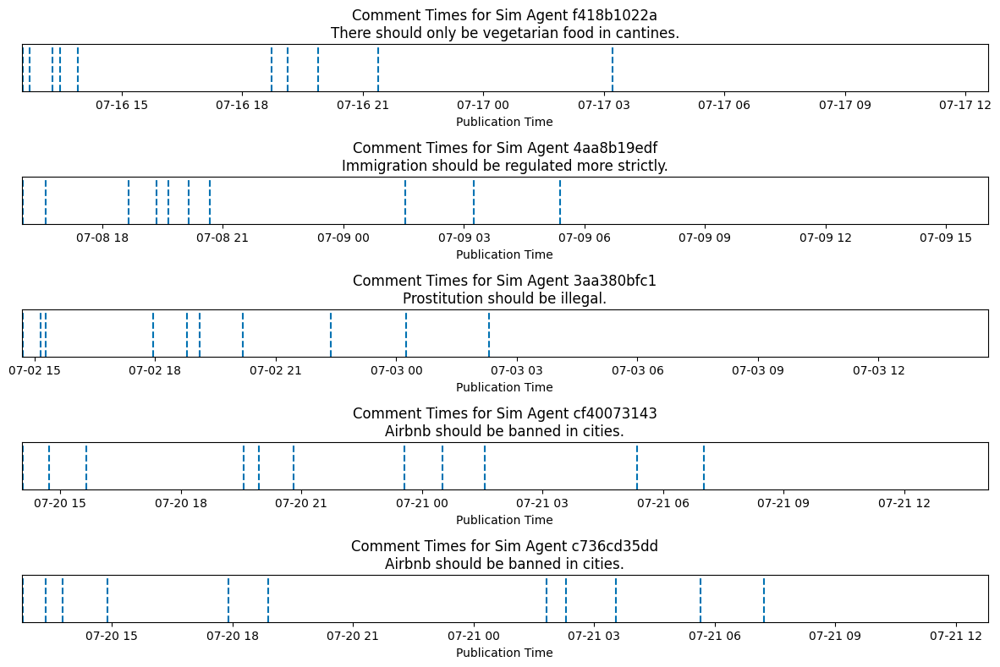

In [73]:
# SIM
temp = sim_discussions_data.groupby(["seed_user_id", "topic_content"]).size().sort_values().tail(5)

j = 0
fig, axs = plt.subplots(5, 1, figsize=(12, 8))
for i, r in temp.items():
    comments = sim_discussions_data[
    sim_discussions_data["seed_user_id"] == i[0]
    ]
    comments = comments[comments["topic_content"] == i[1]][
    "created_at"
    ]
    
    for comment in pd.to_datetime(comments):
        axs[j].axvline(x=comment, linestyle="--", alpha=1)
    
    # axs[j].set_xlim([pd.to_datetime(comments).min() - pd.Timedelta(minutes=1),
    #              pd.to_datetime(comments).max() + pd.Timedelta(minutes=1)])
    axs[j].set_xlim([pd.to_datetime(comments).min() - pd.Timedelta(minutes=1),
                 pd.to_datetime(comments).min() + pd.Timedelta(hours=24, minutes=1)])
    # axs[j].set_ylim([0, 0.9])
    axs[j].set_title(f"Comment Times for Sim Agent {i[0]}\n{i[1]}")
    axs[j].set_xlabel("Publication Time")

    axs[j].set_yticks([])

    j += 1

plt.tight_layout()
if save_figs:
    plt.savefig("figures/sim_burst-top-5.pdf")
plt.show()

In [74]:
# Determine intial activation prob
k = 0
n = 24
ps = [
    0.0025,
    0.00325,
    0.015, 
    0.05, 
    0.1
]

for p in ps:
    print(f"Min. {k+1} over {n}({p})", round(scipy.stats.binom.sf(k, n, p), 3))

Min. 1 over 24(0.0025) 0.058
Min. 1 over 24(0.00325) 0.075
Min. 1 over 24(0.015) 0.304
Min. 1 over 24(0.05) 0.708
Min. 1 over 24(0.1) 0.92


In [75]:
# Visualize Seed activation probability function
discussions_data["created_comment"] = pd.to_datetime(
    discussions_data["created_comment"]
)
discussions_data["interevent_diff"] = discussions_data.sort_values(
    ["ParticipantID", "created_comment"]
).groupby("ParticipantID")["created_comment"].diff().dt.total_seconds()

temp = discussions_data.copy()
temp = temp[temp["subreddit"].isin(simulated_conditions)]

# Intital posts not preceeded by another post hold NA value for ie_diff
seed_ie_total_posts = len(temp)
seed_ie_initial_posts = temp["interevent_diff"].isna().sum()
seed_ie_posts = seed_ie_total_posts - seed_ie_initial_posts
temp.dropna(subset=["interevent_diff"], inplace=True)
temp = temp[temp["interevent_diff"] != 0.0]
# remove outliers
# temp = temp[temp["interevent_diff"] <= get_quartiles(
#     temp["interevent_diff"]
# )[1]]
temp = temp["interevent_diff"].sort_values()
seed_ie_posts_outlier_corrected = len(temp)
seed_ie_posts_outlier_share = round((seed_ie_posts - seed_ie_posts_outlier_corrected) / seed_ie_posts, 3)
ie_times_seed = temp

In [76]:
sim_ie_total_posts = []
sim_ie_initial_posts = []
sim_ie_posts = []
ie_times_sim = []

# Visualize SIM activation probability function
for i in sim_discussions_dfs:
    i["created_at"] = pd.to_datetime(
        i["created_at"]
    )
    i["interevent_diff"] = i.sort_values(
        ["seed_user_id", "created_at"]
    ).groupby("seed_user_id")["created_at"].diff().dt.total_seconds()

    temp = i.copy()
    temp = temp[temp["subreddit"].isin(simulated_conditions)]
    
    # Intital posts not preceeded by another post hold NA value for ie_diff
    sim_ie_total_posts.append(len(temp))
    sim_ie_initial_posts.append(temp["interevent_diff"].isna().sum())
    sim_ie_posts.append(len(temp) - temp["interevent_diff"].isna().sum())
    temp.dropna(subset=["interevent_diff"], inplace=True)
    temp = temp[temp["interevent_diff"] != 0.0]

    ie_times_sim.append(temp)

sim_ie_total_posts = round_mean(sim_ie_total_posts), get_ci(sim_ie_total_posts)
sim_ie_initial_posts = round_mean(sim_ie_initial_posts), get_ci(sim_ie_initial_posts)
sim_ie_posts = round_mean(sim_ie_posts), get_ci(sim_ie_posts)

In [77]:
print("#"*80)
print("{:<30}{:^10}|{:^10}{:^15}".format("Interevent Data", "Seed", "Sim", "CI"))
print("#"*80)
print("{:<30}{:^10}|{:^10}{:^15}".format("Total Posts:", seed_ie_total_posts, sim_ie_total_posts[0], f"{sim_ie_total_posts[1]}"))
print("{:<30}{:^10}|{:^10}{:^15}".format("Initial Posts:", seed_ie_initial_posts, sim_ie_initial_posts[0], f"{sim_ie_initial_posts[1]}"))
print("{:<30}{:^10}|{:^10}{:^15}".format("IE Posts:", seed_ie_posts, sim_ie_posts[0], f"{sim_ie_posts[1]}"))
# print("{:<30}{:^10}|{:^10}".format("IE Posts (Outlier adjusted):", seed_ie_posts_outlier_corrected, sim_ie_posts_outlier_corrected))
# print("{:<30}{:^10}|{:^10}".format("IE Posts % Outliers:", seed_ie_posts_outlier_share, sim_ie_posts_outlier_share))

################################################################################
Interevent Data                  Seed   |   Sim          CI       
################################################################################
Total Posts:                     1897   |  3899.4  (50.062, (3829, 3973))
Initial Posts:                   114    |  172.7   (1.792, (170, 176))
IE Posts:                        1783   |  3726.7  (49.878, (3654, 3801))


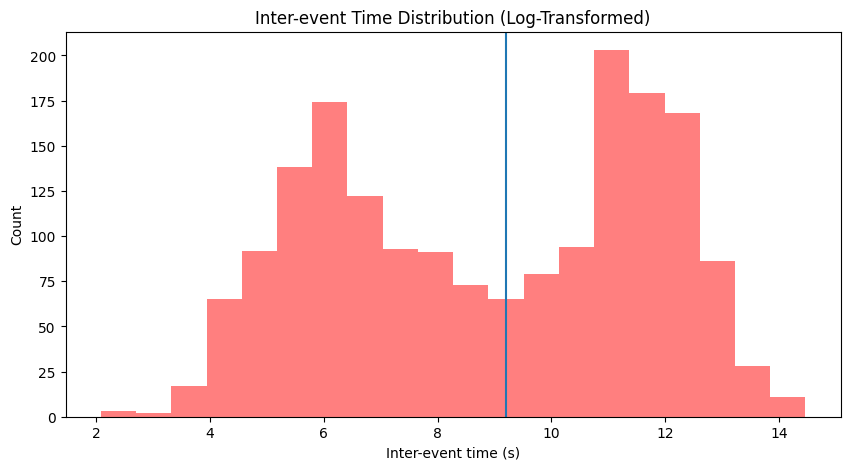

In [196]:
fig, ax = plt.subplots(1,1, figsize=figsize_wide)

ax.hist(np.log(discussions_data["interevent_diff"]), bins=20, color="r", alpha=0.5)
ax.axvline(9.2, color="tab:blue")

ax.set_xlabel("Inter-event time (s)")
ax.set_ylabel("Count")
ax.set_title("Inter-event Time Distribution (Log-Transformed)")

if save_figs:
    plt.savefig("figures/seed_dist_log-ie.pdf")
plt.show()

In [79]:
# temp = discussions_data[~discussions_data["interevent_diff"].isna()]
temp = discussions_data.copy()

intraburst_data = temp[temp["interevent_diff"] <= np.exp(9.2)]
interburst_data = temp[temp["interevent_diff"] > np.exp(9.2)]

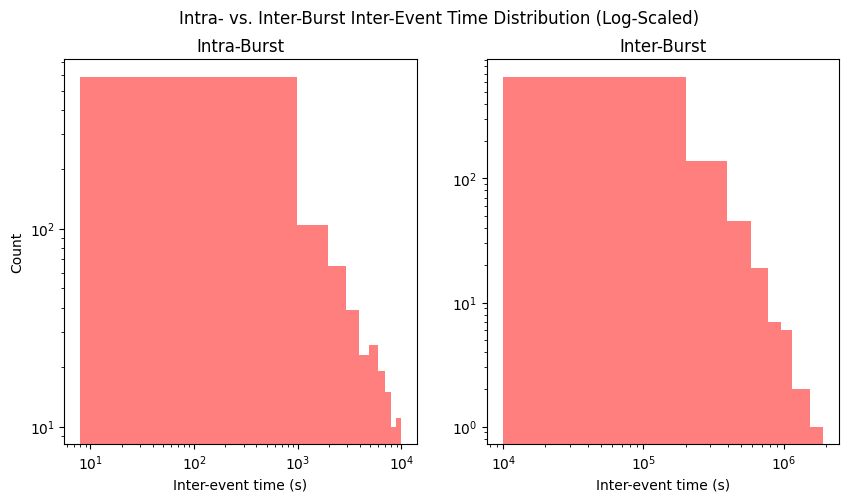

In [199]:
fig, axs = plt.subplots(1, 2, figsize=figsize_wide)

axs[0].hist(intraburst_data["interevent_diff"], color="r", alpha=0.5)
axs[1].hist(interburst_data["interevent_diff"], color="r", alpha=0.5)

axs[0].set_title("Intra-Burst")
axs[0].set_xscale("log")
axs[0].set_xlabel("Inter-event time (s)")
axs[0].set_yscale("log")
axs[0].set_ylabel("Count")

axs[1].set_title("Inter-Burst")
axs[1].set_xscale("log")
axs[1].set_xlabel("Inter-event time (s)")
axs[1].set_yscale("log")

plt.suptitle("Intra- vs. Inter-Burst Inter-Event Time Distribution (Log-Scaled)")
if save_figs:
    plt.savefig("figures/seed_dist_intra-inter-burst.pdf")
plt.show()

In [81]:
# intraburst_data.to_csv("/../abyss/home/oasis/data/intraevent.csv", index=False)

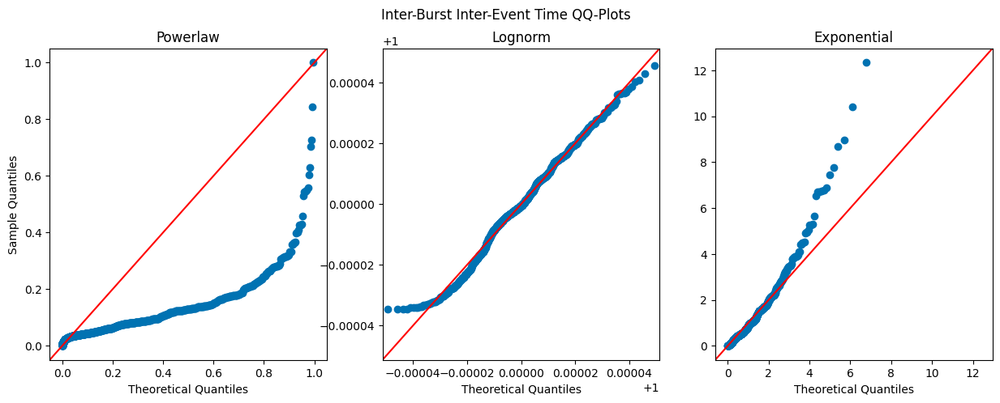

In [82]:
# Interevent
temp = interburst_data
temp = temp["interevent_diff"]

fig, ax = plt.subplots(1, 3, figsize=figsize_ultra_wide)

qqplot(temp, scipy.stats.distributions.powerlaw, line="45", fit=True, ax=ax[0])
ax[0].set_title("Powerlaw")

qqplot(np.log(temp), scipy.stats.distributions.lognorm, line="45", fit=True, ax=ax[1])
ax[1].set_ylabel("")
ax[1].set_title("Lognorm")

qqplot(temp, scipy.stats.distributions.expon, line="45", fit=True, ax=ax[2])
ax[2].set_ylabel("")
ax[2].set_title("Exponential")

plt.suptitle("Inter-Burst Inter-Event Time QQ-Plots")
if save_figs:
    plt.savefig("figures/seed_qqplots_inter-burst.pdf")
plt.show()

In [83]:
# Perform Kolmogorov-Smirnov test
fit_interburst = powerlaw.Fit(xmin=temp.min(), data=temp)

for i, j in zip([fit_interburst.power_law.cdf, fit_interburst.lognormal.cdf, fit_interburst.exponential.cdf], ["powerlaw", "lognormal", "expon"]):
    ks_statistic, p_value = kstest(temp, i)

    print(f"{j} KS Statistic: {ks_statistic}")
    print(f"{j} P-value: {p_value}")

powerlaw KS Statistic: 0.2661461668689245
powerlaw P-value: 1.210390496522637e-55
lognormal KS Statistic: 0.053128598465889576
lognormal P-value: 0.013255783257864046
expon KS Statistic: 0.09143554631789635
expon P-value: 7.231834060416601e-07


In [209]:
save_figs=True
fontsize=14

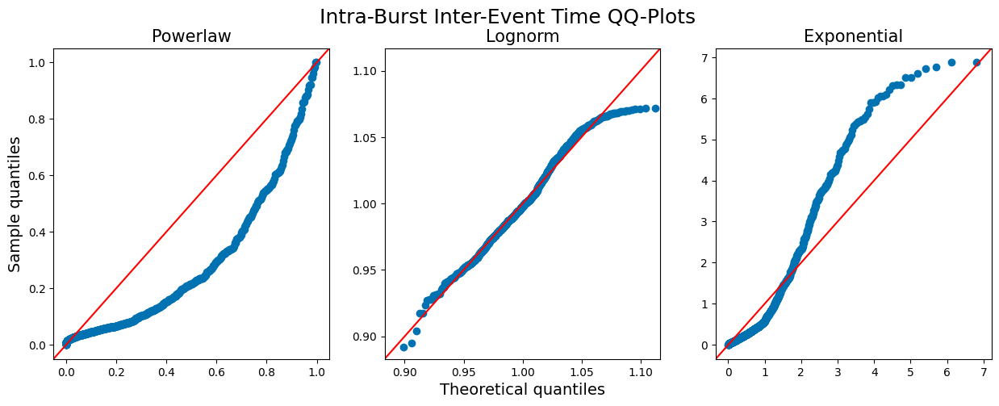

In [210]:
# Intraevent
temp = intraburst_data
temp = temp[temp["interevent_diff"] != 0.0]["interevent_diff"]

fig, ax = plt.subplots(1, 3, figsize=figsize_ultra_wide)

qqplot(temp, scipy.stats.distributions.powerlaw, line="45", fit=True, ax=ax[0])
ax[0].set_title("Powerlaw", fontsize=15)
ax[0].set_xlabel("")
ax[0].set_ylabel("Sample quantiles", fontsize=fontsize)

qqplot(np.log(temp), scipy.stats.distributions.lognorm, line="45", fit=True, ax=ax[1])
ax[1].set_xlabel("Theoretical quantiles", fontsize=fontsize)
ax[1].set_ylabel("")
ax[1].set_title("Lognorm", fontsize=15)

qqplot(temp, scipy.stats.distributions.expon, line="45", fit=True, ax=ax[2])
ax[2].set_xlabel("")
ax[2].set_ylabel("")
ax[2].set_title("Exponential", fontsize=15)

plt.suptitle("Intra-Burst Inter-Event Time QQ-Plots", fontsize=18)
if save_figs:
    plt.savefig("figures/seed_qqplots_intra-burst.pdf")
plt.show()

In [194]:
# Perform Kolmogorov-Smirnov test
fit_intraburst = powerlaw.Fit(xmin=temp.min(), data=temp)

for i, j in zip([fit_intraburst.power_law.cdf, fit_intraburst.lognormal.cdf, fit_intraburst.exponential.cdf], ["powerlaw", "lognormal", "expon"]):
    ks_statistic, p_value = kstest(temp, i)

    print(f"{j} KS Statistic: {ks_statistic}")
    print(f"{j} P-value: {p_value}")

powerlaw KS Statistic: 0.3512143556665225
powerlaw P-value: 7.068412642154448e-100
lognormal KS Statistic: 0.04544856751169524
lognormal P-value: 0.046881475584921506
expon KS Statistic: 0.2107857301028066
expon P-value: 1.3332032430005144e-35


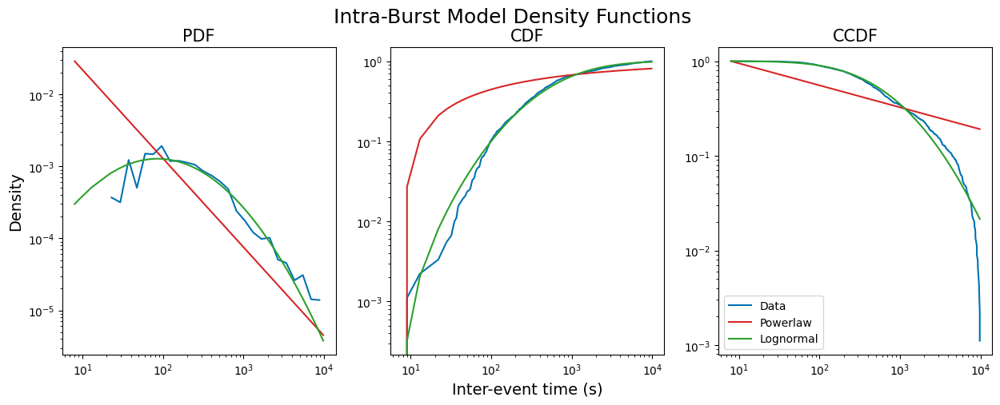

In [211]:
fig, axs = plt.subplots(1, 3, figsize=figsize_ultra_wide)

fit_intraburst.plot_pdf(ax=axs[0])
fit_intraburst.power_law.plot_pdf(color="tab:red", ax=axs[0])
fit_intraburst.lognormal.plot_pdf(color="tab:green", ax=axs[0])
# fit.exponential.plot_pdf(color="r", ax=axs[0])

fit_intraburst.plot_cdf(ax=axs[1])
fit_intraburst.power_law.plot_cdf(color="tab:red", ax=axs[1])
fit_intraburst.lognormal.plot_cdf(color="tab:green", ax=axs[1])
# fit.exponential.plot_cdf(color="r", ax=axs[1])

fit_intraburst.plot_ccdf(ax=axs[2], label="Data")
fit_intraburst.power_law.plot_ccdf(color="tab:red", ax=axs[2], label="Powerlaw")
fit_intraburst.lognormal.plot_ccdf(color="tab:green", ax=axs[2], label="Lognormal")
# fit.exponential.plot_ccdf(color="r", ax=axs[2], label="Exponential")

axs[0].set_ylabel("Density", fontsize=fontsize)
axs[0].set_title("PDF", fontsize=15)

axs[1].set_xlabel("Inter-event time (s)", fontsize=fontsize)
axs[1].set_title("CDF", fontsize=15)

axs[2].set_title("CCDF", fontsize=15)

plt.legend()
plt.suptitle("Intra-Burst Model Density Functions", fontsize=18)
if save_figs:
    plt.savefig("figures/seed_intra-burst-fit_density-func.pdf")
plt.show()

In [87]:
# Perform Kolmogorov-Smirnov test
fit = powerlaw.Fit(xmin=discussions_data["interevent_diff"].min(), data=discussions_data["interevent_diff"])

for i, j in zip([fit.power_law.cdf, fit.lognormal.cdf, fit.exponential.cdf], ["powerlaw", "lognormal", "expon"]):
    ks_statistic, p_value = kstest(temp, i)

    print(f"{j} KS Statistic: {ks_statistic}")
    print(f"{j} P-value: {p_value}")

powerlaw KS Statistic: 0.35266969265967996
powerlaw P-value: 9.961160064136069e-101
lognormal KS Statistic: 0.47018191796163744
lognormal P-value: 3.185930250080669e-183
expon KS Statistic: 0.8882603711452208
expon P-value: 0.0


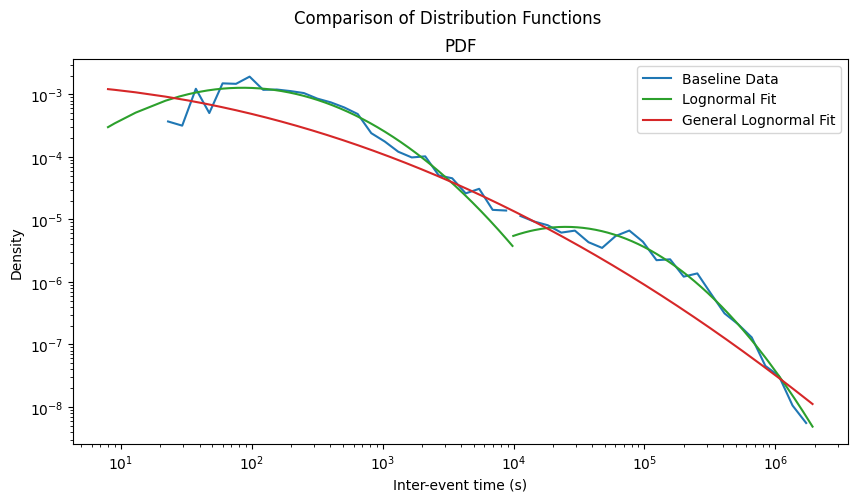

In [200]:
fig, axs = plt.subplots(1, 1, figsize=figsize_wide)

fit_intraburst.plot_pdf(ax=axs, color="tab:blue")
# fit.power_law.plot_pdf(color="r", ax=axs)
fit_intraburst.lognormal.plot_pdf(color="tab:green", ax=axs)

fit_interburst.plot_pdf(ax=axs, color="tab:blue", label="Baseline Data")
# fit.power_law.plot_pdf(color="r", ax=axs)
fit_interburst.lognormal.plot_pdf(color="tab:green", ax=axs, label="Lognormal Fit")

fit.lognormal.plot_pdf(color="tab:red", ax=axs, label="General Lognormal Fit")

axs.set_xlabel("Inter-event time (s)")
axs.set_ylabel("Density")
axs.set_title("PDF")

plt.legend()
plt.suptitle("Comparison of Distribution Functions")
if save_figs:
    plt.savefig("figures/seed_intra-inter-burst-fit_pdf.pdf")
plt.show()

In [89]:
mu = fit_intraburst.lognormal.mu
sigma = fit_intraburst.lognormal.sigma
alpha = fit_intraburst.power_law.alpha

print(f"Lognorm mu: {mu}")
print(f"Lognorm sigma: {sigma}")
print(f"Powerlaw alpha: {alpha}")

Lognorm mu: 6.379525877997073
Lognorm sigma: 1.3899986606297763
Powerlaw alpha: 1.2323048606258498


In [90]:
# Compare power law with exponential distribution
R, p = fit_intraburst.distribution_compare("lognormal", "exponential")
print(f"power-law vs. exponential: R = {R}, p = {p}")

# Compare power law with log-normal distribution
R, p = fit_intraburst.distribution_compare("lognormal", "power_law")
print(f"power-law vs. log-normal: R = {R}, p = {p}")

power-law vs. exponential: R = 123.97164440472409, p = 3.5881721143406895e-19
power-law vs. log-normal: R = 646.5728538430074, p = 7.321389687849388e-240


In [91]:
# Lognormal dist fits data best ()
x = 3600
cdf_value = round(scipy.stats.lognorm.sf(x, s=fit_intraburst.lognormal.sigma, scale=np.exp(fit_intraburst.lognormal.mu)), 3)
print(f"P(i) at {round(x/60/60, 2)}h ({x}s) is {cdf_value}")

P(i) at 1.0h (3600s) is 0.097


In [92]:
# I get the longest IE diff of all simulations (per topic and sub)
sim_max_ie_diff = sim_discussions_dfs[0].groupby(
    ["subreddit", "topic"]
)["created_at"].agg(lambda x: (x.max() - x.min()).total_seconds()).max()

In [93]:
# fig, axs = plt.subplots(1, 1, figsize=figsize_regular)

# axs.hist([i for i in ie_times_sim[0]["interevent_diff"] if i < sim_max_ie_diff], density=True, label="Sim")
# axs.hist([i for i in ie_times_seed if i < sim_max_ie_diff], density=True, alpha=0.5, bins=10, label="Baseline", color="r")
# # axs.hist(temp, density=True, bins=5468)

# axs.set_xlabel("Inter-event time (s)")
# # axs.set_xscale("log")
# # axs.set_xlim(0, 180000)
# axs.set_ylabel("Density")
# # axs.set_yscale("log")


# plt.title("Inter-Event Time Distribution")
# plt.legend()
# if save_figs:
#     plt.savefig("figures/seed-sim_dist_ie-times.pdf")
# plt.show()

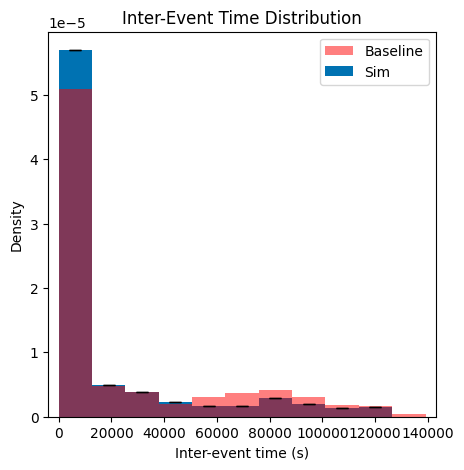

In [94]:
fig, ax = plt.subplots(1, 1, figsize=figsize_regular)

temp_sim = []
for i in range(1, 2):
    temp = perspective_data[perspective_data["n_run"] == i]
    temp_sim.append([i for i in temp["interevent_diff"].dropna() if i < sim_max_ie_diff])
    
_, bw = plot_multirun_hist_a(temp_sim, density=True, ax=ax, bins=10)

temp = [i for i in ie_times_seed if i < sim_max_ie_diff]
temp = [i for i in ie_times_seed if i < 130000]

ax.hist(temp, density=True, color="r", alpha=0.5, label="Baseline", bins=binner(temp, bw))
ax.set_xlabel("Inter-event time (s)")
ax.set_xlim(-4000, 143000)
ax.set_ylabel("Density")
ax.legend()
ax.set_title("Inter-Event Time Distribution")
if save_figs:
    plt.savefig("figures/seed-sim_dist_ie-times.pdf")
plt.show()

In [95]:
scipy.stats.ks_2samp([i for i in ie_times_sim[0]["interevent_diff"] if i < sim_max_ie_diff], [i for i in ie_times_seed if i < sim_max_ie_diff])

KstestResult(statistic=0.3664799677540623, pvalue=1.5243723233739199e-117, statistic_location=1066.0, statistic_sign=-1)

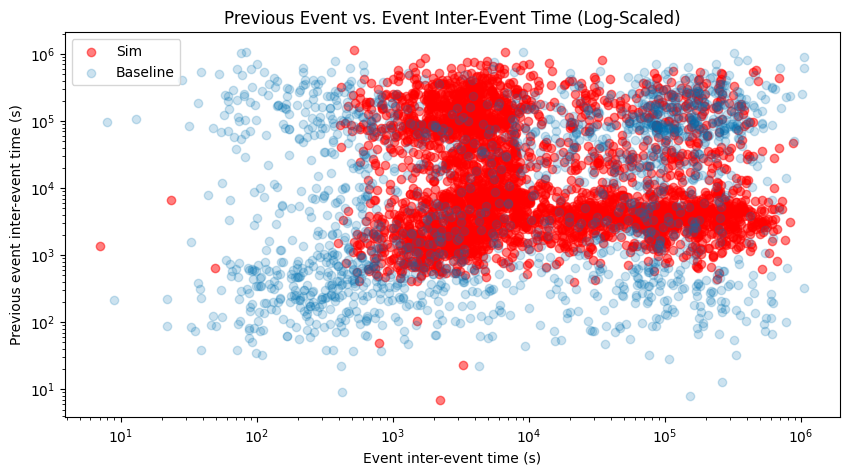

In [163]:
n_contributions_lb = 2
n_contributions_ub = 90
temp = discussions_data[discussions_data["interevent_diff"] <= sim_discussions_dfs[0]["interevent_diff"].max()]
# temp = discussions_data[discussions_data["interevent_diff"] <= np.exp(9)]


temp = temp[~temp["interevent_diff"].isna()]

temp = temp.sort_values("created_comment").groupby("ParticipantID").filter(lambda x: len(x) >= n_contributions_lb and len(x) <= n_contributions_ub)

seed_x = temp.groupby("ParticipantID").apply(lambda x: x.tail(len(x) - 1), include_groups=False)["interevent_diff"]
seed_y = temp.groupby("ParticipantID").apply(lambda x: x.head(len(x) - 1), include_groups=False)["interevent_diff"]

temp = sim_discussions_dfs[0]#[sim_discussions_data["interevent_diff"] <= np.exp(9)]

temp = temp[~temp["interevent_diff"].isna()]

temp = temp.sort_values("created_at").groupby("seed_user_id").filter(lambda x: len(x) >= n_contributions_lb and len(x) <= n_contributions_ub)

sim_x = temp.groupby("seed_user_id").apply(lambda x: x.tail(len(x) - 1), include_groups=False)["interevent_diff"]
sim_y = temp.groupby("seed_user_id").apply(lambda x: x.head(len(x) - 1), include_groups=False)["interevent_diff"]

# Plot IE diff for current and prev event

fig, ax = plt.subplots(1, 1, figsize=figsize_wide)

ax.scatter(sim_x, sim_y, alpha=0.5, label="Sim", color="r")
ax.scatter(seed_x, seed_y, alpha=0.2, label="Baseline")

ax.set_xlabel("Event inter-event time (s)")
ax.set_ylabel("Previous event inter-event time (s)")

ax.set_xscale("log")
ax.set_yscale("log")

ax.set_title("Previous Event vs. Event Inter-Event Time (Log-Scaled)")
ax.legend()

if save_figs:
    plt.savefig("figures/seed-sim_scatter_ie-prev-current-event.pdf")
plt.show()

In [98]:
# Autocorrelation of user/agent inter-event times
temp = discussions_data#[discussions_data["interevent_diff"] <= np.exp(9)]

temp = temp[~temp["interevent_diff"].isna()]

temp = temp.sort_values("created_comment").groupby("ParticipantID").filter(lambda x: len(x) >= n_contributions_lb and len(x) <= n_contributions_ub)

mean_corrs = temp.groupby("ParticipantID").apply(lambda x: sm.tsa.acf(x["interevent_diff"], nlags=1)[1], include_groups=False)
mean_ps = temp.groupby("ParticipantID").apply(lambda x: sm.tsa.acf(x["interevent_diff"], nlags=1, qstat=True)[2][0], include_groups=False)

print(round_mean(list(mean_corrs)), get_ci(list(mean_corrs)))
print(round_mean(list(mean_ps)), get_ci(list(mean_ps)))

-0.072 (0.255, (-0.8624823329973323, 0.6004063414977737))
0.492 (0.301, (0.003059617557444728, 0.9969727501944269))


In [99]:
temp = sim_discussions_dfs[0]#[sim_discussions_data["interevent_diff"] <= np.exp(9)]

temp = temp[~temp["interevent_diff"].isna()]

temp = temp.sort_values("created_at").groupby("seed_user_id").filter(lambda x: len(x) >= n_contributions_lb and len(x) <= n_contributions_ub)

mean_corrs = temp.groupby("seed_user_id").apply(lambda x: sm.tsa.acf(x["interevent_diff"], nlags=1)[1], include_groups=False)
mean_ps = temp.groupby("seed_user_id").apply(lambda x: sm.tsa.acf(x["interevent_diff"], nlags=1, qstat=True)[2][0], include_groups=False)

print(round_mean(list(mean_corrs)), get_ci(list(mean_corrs)))
print(round_mean(list(mean_ps)), get_ci(list(mean_ps)))

-0.184 (0.175, (-0.6662954877515277, 0.35840517421435336))
0.406 (0.279, (0.03074056035706582, 0.9547497206059439))


In [100]:
# Autocorrelation of active user/agent inter-event times
n_contributions_lb = 40
n_contributions_ub = 90

temp = discussions_data#[discussions_data["interevent_diff"] <= np.exp(9)]

temp = temp[~temp["interevent_diff"].isna()]

temp = temp.sort_values("created_comment").groupby("ParticipantID").filter(lambda x: len(x) >= n_contributions_lb and len(x) <= n_contributions_ub)

mean_corrs = temp.groupby("ParticipantID").apply(lambda x: sm.tsa.acf(x["interevent_diff"], nlags=1)[1], include_groups=False)
mean_ps = temp.groupby("ParticipantID").apply(lambda x: sm.tsa.acf(x["interevent_diff"], nlags=1, qstat=True)[2][0], include_groups=False)

print(round_mean(list(mean_corrs)), get_ci(list(mean_corrs)))
print(round_mean(list(mean_ps)), get_ci(list(mean_ps)))

0.145 (0.129, (-0.0877554223396884, 0.36882750939562275))
0.318 (0.308, (0.003059617557444728, 0.9306834872662287))


In [101]:
temp = sim_discussions_dfs[0]#[sim_discussions_data["interevent_diff"] <= np.exp(9)]

temp = temp[~temp["interevent_diff"].isna()]

temp = temp.sort_values("created_at").groupby("seed_user_id").filter(lambda x: len(x) >= n_contributions_lb and len(x) <= n_contributions_ub)

mean_corrs = temp.groupby("seed_user_id").apply(lambda x: sm.tsa.acf(x["interevent_diff"], nlags=1)[1], include_groups=False)
mean_ps = temp.groupby("seed_user_id").apply(lambda x: sm.tsa.acf(x["interevent_diff"], nlags=1, qstat=True)[2][0], include_groups=False)

print(round_mean(list(mean_corrs)), get_ci(list(mean_corrs)))
print(round_mean(list(mean_ps)), get_ci(list(mean_ps)))

-0.075 (0.072, (-0.21317619486456654, 0.046392650019621715))
0.581 (0.255, (0.11369473733948737, 0.9425600776473242))


***
# Content Analysis

In [102]:
if run_perspective:
    with open("perspective_secret.txt", "r") as f:
        api_key = f.read()
    
    for i in range(len(sim_discussions_dfs)):
        sim_discussions_dfs[i]["n_run"] = i+1
        sim_discussions_dfs[i]["content_toxicity"] = sim_discussions_dfs[i]["content"].progress_apply(pu.query_perspective, api_key=api_key)
    
    perspective_data = pd.DataFrame()
    
    for i in sim_discussions_dfs:
        perspective_data = pd.concat([perspective_data, i])
    
    perspective_data.to_csv(f"{data_path}data/sim_discussions_data_perspective.csv", index=False)

In [103]:
# Max comment count over sim runs
temp_corr = []
for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    temp_corr.append(temp.groupby("seed_user_id").size().max())

round_mean(temp_corr), get_ci(temp_corr)

(66.4, (4.923, (60, 78)))

In [104]:
# Correlation between individual seed users tox and sim agent tox
temp_corr = []
temp_ps = []

for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    x = user_data[user_data["comment_mean_tox"] != 0]
    y = temp.groupby("seed_user_id")["content_toxicity"].apply(np.mean)

    temp = x[["ParticipantID", "comment_mean_tox"]].merge(y, left_on="ParticipantID", right_on="seed_user_id")
    # print(temp.isna().any())
    temp_corr.append(scipy.stats.pearsonr(temp["comment_mean_tox"], temp["content_toxicity"])[0])
    temp_ps.append(scipy.stats.pearsonr(temp["comment_mean_tox"], temp["content_toxicity"])[1])

print(round_mean(temp_corr), get_ci(temp_corr))
print(round_mean(temp_ps), get_ci(temp_ps))

0.093 (0.076, (-0.02956142704150199, 0.1796416661568918))
0.36 (0.283, (0.06669976746621233, 0.7626254393969378))


In [105]:
round_mean(perspective_data["content_toxicity"], "median"), get_ci(perspective_data["content_toxicity"], "median")

(0.12, (0.119, (0.00512067, 0.7998551)))

In [106]:
temp = discussions_data.dropna(subset="comment_toxicity")["comment_toxicity"]
round_mean(temp, "median"), get_ci(temp, "median")

(0.048, (0.118, (0.0043667066, 0.8403191)))

In [176]:
perspective_data.groupby("topic_content")["content_toxicity"].apply(get_ci)

topic_content
A universal basic income would kill the economy.                                                          0.099
Airbnb should be banned in cities.                                                                        0.099
Artificial intelligence should replace humans where possible.                                             0.087
Climate change is one of the greatest threats to humanity.                                                0.110
Employers should mandate vaccination.                                                                     0.116
Fur clothing should be banned.                                                                            0.124
Immigration should be regulated more strictly.                                                            0.116
Police officers should wear body cameras.                                                                 0.115
Prostitution should be illegal.                                                           

In [108]:
print(perspective_data["content_toxicity"].mean())
y = perspective_data.groupby("topic_content")["content_toxicity"].apply(np.mean)
print(get_ci(y))
y

0.1563500588019413
(0.048, (0.09026961608268216, 0.25682469174014155))


topic_content
A universal basic income would kill the economy.                                                          0.138637
Airbnb should be banned in cities.                                                                        0.098522
Artificial intelligence should replace humans where possible.                                             0.090270
Climate change is one of the greatest threats to humanity.                                                0.117121
Employers should mandate vaccination.                                                                     0.110042
Fur clothing should be banned.                                                                            0.158587
Immigration should be regulated more strictly.                                                            0.169798
Police officers should wear body cameras.                                                                 0.111486
Prostitution should be illegal.                                   

In [174]:
print(discussions_data["comment_toxicity"].mean())
print(get_ci(discussions_data["comment_toxicity"]))
x = discussions_data.groupby("post_title")["comment_toxicity"].apply(get_ci)
x

0.10277250295871963
nan


post_title
A universal basic income would kill the economy.                                                            NaN
Airbnb should be banned in cities.                                                                        0.070
Artificial intelligence should replace humans where possible.                                               NaN
Climate change is one of the greatest threats to humanity.                                                0.063
Employers should mandate vaccination.                                                                     0.091
Fur clothing should be banned.                                                                              NaN
Immigration should be regulated more strictly.                                                            0.088
Police officers should wear body cameras.                                                                 0.110
Prostitution should be illegal.                                                              

In [109]:
print(discussions_data["comment_toxicity"].mean())
x = discussions_data.groupby("post_title")["comment_toxicity"].apply(np.mean)
print(get_ci(x))
x

0.10277250295871963
(0.043, (0.03671830754807693, 0.18130673371276596))


post_title
A universal basic income would kill the economy.                                                          0.077267
Airbnb should be banned in cities.                                                                        0.041915
Artificial intelligence should replace humans where possible.                                             0.036718
Climate change is one of the greatest threats to humanity.                                                0.059815
Employers should mandate vaccination.                                                                     0.068834
Fur clothing should be banned.                                                                            0.082148
Immigration should be regulated more strictly.                                                            0.078789
Police officers should wear body cameras.                                                                 0.078369
Prostitution should be illegal.                                      

In [111]:
# Correlation between Baseline topic tox and simulated topic tox averaged across runs
temp_corr = []
temp_ps = []

x = discussions_data.groupby("post_title")["comment_toxicity"].apply(np.mean)
x = pd.DataFrame(x).reset_index()
for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    y = temp.groupby("topic_content")["content_toxicity"].apply(np.mean)

    temp = x[["post_title", "comment_toxicity"]].merge(y, left_on="post_title", right_on="topic_content")
    # print(temp.isna().any())
    temp_corr.append(scipy.stats.pearsonr(temp["comment_toxicity"], temp["content_toxicity"])[0])
    temp_ps.append(scipy.stats.pearsonr(temp["comment_toxicity"], temp["content_toxicity"])[1])

print(round_mean(temp_corr), get_ci(temp_corr))
print(round_mean(temp_ps), get_ci(temp_ps))

0.718 (0.09, (0.5336361711104849, 0.8378253302937955))
0.003 (0.005, (7.574559090514386e-06, 0.018617050123439127))


In [112]:
perspective_data["sim_comment_mean_tox"] = perspective_data.groupby("seed_user_id")["content_toxicity"].transform("mean")

In [113]:
y = perspective_data.sort_values("seed_user_id").drop_duplicates(subset="seed_user_id")["sim_comment_mean_tox"]
x = user_data.sort_values("ParticipantID")["comment_mean_tox"]

scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=0.09790089383544506, pvalue=0.19105286301154545)

In [160]:
# Correlation of parent comment and reply length - seed
x = []
y = []

temp = discussions_data[discussions_data["parent_id"].isin(discussions_data["comment_id"])].set_index("comment_id")

for i, r in temp.iterrows():
    parent_id = r["parent_id"]
    if parent_id in temp.index:
        y.append(r["length_comment_char"])
        x.append(temp.at[parent_id, "length_comment_char"])

scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=0.44497879517779404, pvalue=8.200098060083737e-39)

In [114]:
perspective_data["new_id"] = perspective_data['n_run'].astype(str) + "_" + perspective_data['subreddit'].astype(str)  + "_" + perspective_data['topic'].astype(str) + "_" + perspective_data['comment_id'].astype(str)
perspective_data["new_parent_id"] = perspective_data['n_run'].astype(str) + "_" + perspective_data['subreddit'].astype(str)  + "_" + perspective_data['topic'].astype(str)  + "_" + perspective_data['parent_comment_id'].astype(str)

In [115]:
# Correlation of parent comment and reply length - seed
x = []
y = []

temp = perspective_data[perspective_data["new_parent_id"].isin(perspective_data["new_id"])].set_index("new_id")

for i, r in temp.iterrows():
    parent_id = r["new_parent_id"]
    if parent_id in temp.index:
        y.append(r["sim_comment_length"])
        x.append(temp.at[parent_id, "sim_comment_length"])

scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=0.23377442915815516, pvalue=3.180974840820189e-116)

In [116]:
# Correlation of parent comment and reply length - seed
coeffs = []
ps = []

for r in range(1, 11):
    x = []
    y = []
    
    temp = perspective_data[perspective_data["new_parent_id"].isin(perspective_data["new_id"])].set_index("new_id")
    temp = temp[temp["n_run"] == r]
    
    for i, r in temp.iterrows():
        parent_id = r["new_parent_id"]
        if parent_id in temp.index:
            y.append(r["sim_comment_length"])
            x.append(temp.at[parent_id, "sim_comment_length"])
    
    coeffs.append(scipy.stats.pearsonr(x, y)[0])
    ps.append(scipy.stats.pearsonr(x, y)[1])

print(round_mean(coeffs, digits=3), get_ci(coeffs, digits=3))
print(round_mean(ps, digits=3), get_ci(ps, digits=3))

0.233 (0.047, (0.15804082956665508, 0.2975275767318818))
0.0 (0.0, (5.157036038709304e-21, 1.9426773269452936e-06))


***
# Interaction Analysis

In [117]:
# Correlation between seed user comment count and agent comment count
temp_corr = []
temp_ps = []

x = user_data
# print(len(x))
# x = pd.DataFrame(x).reset_index()
for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    y = temp.groupby("seed_user_id").size()
    # print(len(y))

    temp = x[["ParticipantID", "comment_count"]].merge(y.rename("sim_comment_count"), left_on="ParticipantID", right_on="seed_user_id", how="outer")
    temp.fillna(0, inplace=True)
    # print(len(temp))
    # print(temp.isna().any())
    temp_corr.append(scipy.stats.pearsonr(temp["comment_count"], temp["sim_comment_count"])[0])
    temp_ps.append(scipy.stats.pearsonr(temp["comment_count"], temp["sim_comment_count"])[1])

print(round_mean(temp_corr), get_ci(temp_corr))
print(round_mean(temp_ps), get_ci(temp_ps))

0.153 (0.026, (0.11319132391916863, 0.1851270788820255))
0.053 (0.043, (0.012847059288536081, 0.13030313867831117))


In [118]:
discussions_data["created_comment"] = pd.to_datetime(
    discussions_data["created_comment"]
)
discussions_data.groupby(["subreddit", "post_title"])["created_comment"].transform(
    lambda x: x.max() - x.min()
).median()

Timedelta('6 days 00:31:01')

In [119]:
# Correlation between self-reported vars and comment # for llm agents
for j in ["polinterest", "time_online", "social_media", "comments_online"]:
        corr = scipy.stats.spearmanr(sim_user_data["sim_comment_count"],
                                     sim_user_data[j])
        print(j, corr[0], corr[1])

polinterest 0.10998007741013503 0.1416375950090745
time_online 0.26142746163917724 0.0003928634421349915
social_media 0.21789768615574417 0.00329880680587256
comments_online 0.8333031436717667 1.0805682793087944e-47


In [120]:
# Correlation between self-reported vars and comment # for seed users
for j in ["polinterest", "time_online", "social_media", "comments_online"]:
        corr = scipy.stats.spearmanr(user_data["comment_count"],
                                     user_data[j])
        print(j, corr[0], corr[1])

polinterest -0.09329179330733586 0.21289682070063573
time_online -0.05610730324775673 0.4543975735117016
social_media 0.003319901272030702 0.9647203003814748
comments_online 0.07317276640285604 0.3289724720627104


In [122]:
temp = sim_user_data.sort_values("seed_user_id")

sample = pd.read_csv(f"{data_path}oswald-et-al_2025/sample_anon.csv")

perspective_data = pd.read_csv(f"{data_path}data/sim_discussions_data_perspective.csv")

In [123]:
# Correlation between user/agent activity
seed_sim_activity_corr = []

for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    x = user_data
    y = temp.groupby("seed_user_id").size()
    y.rename("sim_comment_count", inplace=True)

    temp = x[["ParticipantID", "comment_count"]].merge(y, left_on="ParticipantID", right_on="seed_user_id", how="outer")
    temp.fillna(0, inplace=True)
    seed_sim_activity_corr.append(scipy.stats.pearsonr(temp["comment_count"], temp["sim_comment_count"]))

In [124]:
coeffs = [i[0] for i in seed_sim_activity_corr]
ps = [i[1] for i in seed_sim_activity_corr]

print(round_mean(coeffs), get_ci(coeffs))
print(round_mean(ps), get_ci(ps))

0.153 (0.026, (0.11319132391916863, 0.1851270788820255))
0.053 (0.043, (0.012847059288536081, 0.13030313867831117))


In [125]:
# Correlation between user/agent activity (active users only)
seed_sim_activity_corr_actives = []

for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    x = user_data[user_data["comment_count"] != 0]
    y = temp.groupby("seed_user_id").size()
    y.rename("sim_comment_count", inplace=True)

    temp = x[["ParticipantID", "comment_count"]].merge(y, left_on="ParticipantID", right_on="seed_user_id")
    temp.fillna(0, inplace=True)
    seed_sim_activity_corr_actives.append(scipy.stats.pearsonr(temp["comment_count"], temp["sim_comment_count"]))

In [126]:
coeffs = [i[0] for i in seed_sim_activity_corr_actives]
ps = [i[1] for i in seed_sim_activity_corr_actives]

print(round_mean(coeffs), get_ci(coeffs))
print(round_mean(ps), get_ci(ps))

0.195 (0.044, (0.11494899236684351, 0.2511127903696085))
0.069 (0.07, (0.008141394847292188, 0.23616935362837296))


In [127]:
# Correlation between a topic's toxicity and comment volume - seed
x = discussions_data.groupby("post_title")["comment_toxicity"].mean()
y = discussions_data.groupby("post_title")["Collected comments"].unique().apply(sum)

scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=0.20108212666569675, pvalue=0.39527155658029034)

In [128]:
# Correlation between a topic's toxicity and comment volume - sim
for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    x = temp.groupby("topic_content")["content_toxicity"].mean()
    y = temp.groupby("topic_content").size()
    
    print(scipy.stats.pearsonr(x, y))

PearsonRResult(statistic=0.15613892085724693, pvalue=0.5109471732208523)
PearsonRResult(statistic=0.14541320146909986, pvalue=0.5407361346187567)
PearsonRResult(statistic=-0.033115691944082606, pvalue=0.8897668062956942)
PearsonRResult(statistic=0.1563966112079428, pvalue=0.5102412618769981)
PearsonRResult(statistic=0.10490097596442224, pvalue=0.6598341287710888)
PearsonRResult(statistic=0.08534725872936816, pvalue=0.7205214959425461)
PearsonRResult(statistic=-0.24663370500015033, pvalue=0.2945173097529431)
PearsonRResult(statistic=0.2263923579272262, pvalue=0.3371524929903917)
PearsonRResult(statistic=0.16168619111154867, pvalue=0.4958548679702449)
PearsonRResult(statistic=0.19447148118781848, pvalue=0.41130972059830173)


In [129]:
x = discussions_data.groupby("post_title").size()

for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    y = temp.groupby("topic_content").size()
    # print(y)

scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=-0.2644810231566431, pvalue=0.25980682103670194)

In [130]:
x = discussions_data[discussions_data["subreddit"] == 1].groupby("post_title").size()
y = discussions_data[discussions_data["subreddit"] == 6].groupby("post_title").size()
scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=-0.13641213322734433, pvalue=0.566330371585737)

# Process data to be compatible with Oswald 02-RQ1-participation.Rmd

In [131]:
if output_oswald_data:
    sample = sample[[
        "ParticipantID", 
        "gender", 
        "age",
        "education", 
        "leftright", 
        "affective_polarization", 
        "affective_pol_1",
        "affective_pol_2",
        "pol_cynicism",
        "efficacy",
        "trust_general_1",
        "trust_general_2",
        "trust_general_3",
        "trust_general_4"
    ]]
    
    run = perspective_data[perspective_data["n_run"].isin(list(range(1, 11)))]
    temp = temp.set_index("seed_user_id").merge(run.groupby("seed_user_id")["content_toxicity"].mean(), left_index=True, right_index=True, how="outer").reset_index()
    temp.rename(columns={"content_toxicity": "comment_mean_tox"}, inplace=True)
    
    temp = temp.merge(sample, left_on="seed_user_id", right_on="ParticipantID")
    
    temp = temp.drop("ParticipantID", axis=1)
    
    temp.to_csv(f"{data_path}sim_sample_data_all.csv", index=False)
    
    temp = perspective_data[perspective_data["n_run"] == 1]
    temp = temp[temp["subreddit"].isin([1, 6])]
    temp.to_csv(f"{data_path}sim_discussions_data.csv", index=False)

***
# Two-Step Join Analysis

In [132]:
join_dfs = []

for i in range(3, 11):
    run_dir = "{:02d}".format(i)
    join_dfs.append(pd.read_csv(f"{data_path}data/{run_dir}_run/sim_metrics.csv",
                        converters={"joined_agents": pd.eval,
                                   "disconnected_agents": pd.eval}))

join_data = join_dfs[0]

In [133]:
len(join_dfs)

8

In [134]:
join_data.columns

Index(['subreddit', 'topic', 'joined_agents', 'disconnected_agents'], dtype='object')

In [135]:
join_data["n_joined_agents"] = join_data["joined_agents"].apply(len)
join_data["n_disconnected_agents"] = join_data["disconnected_agents"].apply(len)

In [136]:
join_data["joined_users"] = list(discussions_data.groupby(["subreddit", "topic"])["ParticipantID"].unique())
join_data["n_joined_users"] = join_data["joined_users"].apply(len)

In [137]:
temp = []
temp_n = []
for i, r in join_data.iterrows():
    m = [i for i in r["joined_agents"] if i in r ["joined_users"]]
    temp.append(m)
    temp_n.append(len(m) / len(r["joined_agents"]))

In [138]:
join_data["joined_match"] = temp
join_data["joined_correct"] = temp_n

In [139]:
join_data

,subreddit,topic,joined_agents,disconnected_agents,n_joined_agents,n_disconnected_agents,joined_users,n_joined_users,joined_match,joined_correct
0,1,1,"[2b7239befb, f232063f58, e34e6c69cd, 536f973f0...","[5, 6, 8, 9, 11, 15, 20, 21, 25, 28, 29, 33, 3...",80,34,"[065f4ecbef, 55f9f235c7, b7bbd5cd51, fc37bfdd3...",17,"[065f4ecbef, 20755dab4b, e51abce375, b7bbd5cd5...",0.212500
1,1,2,"[f232063f58, e34e6c69cd, 7e3d73c71f, 9d5641c98...",[],24,0,"[065f4ecbef, 0cc8f32fca, a878f9f52d, 55f9f235c...",18,"[4858d99a77, e4b8dcd343, 61edaf9c9e, 7eb846113...",0.291667
2,1,3,"[f232063f58, 7e3d73c71f, 14d3fd045f, 4858d99a7...","[1, 4, 38, 49]",24,4,"[72df7fc80b, a878f9f52d, b7bbd5cd51, 065f4ecbe...",40,"[7e3d73c71f, 4858d99a77, a6760b4720, bb3a8fd9e...",0.458333
3,1,4,"[2b7239befb, f232063f58, e34e6c69cd, 7e3d73c71...","[1, 4, 5, 10, 14, 15, 25, 34, 35, 42, 45, 48, ...",63,22,"[a878f9f52d, 7e3d73c71f, 8bea3e8d82, 08e8f9494...",29,"[e34e6c69cd, 7e3d73c71f, 20755dab4b, a878f9f52...",0.365079
4,1,5,"[2b7239befb, f232063f58, e34e6c69cd, 536f973f0...","[4, 5, 7, 8, 12, 13, 14, 16, 17, 18, 20, 26, 3...",78,34,"[4aa8b19edf, fc37bfdd35, 20755dab4b, 72df7fc80...",11,"[20755dab4b, e51abce375, 9013b68a49, fc37bfdd3...",0.141026
5,1,6,"[2b7239befb, e34e6c69cd, 536f973f0c, e7f0ed645...","[6, 7, 8, 9, 12, 15, 17, 18, 21, 25, 26, 32, 3...",68,25,"[4aa8b19edf, 4858d99a77, 0cc8f32fca, 72df7fc80...",25,"[e34e6c69cd, 065f4ecbef, 20755dab4b, a878f9f52...",0.264706
6,1,7,"[2b7239befb, 536f973f0c, 7e3d73c71f, 371a89c86...","[0, 3, 37, 42, 52]",35,5,"[a878f9f52d, 9013b68a49, e4b8dcd343, e34e6c69c...",25,"[065f4ecbef, a6760b4720, 9013b68a49, b7bbd5cd5...",0.314286
7,1,8,"[2b7239befb, f232063f58, 536f973f0c, 7e3d73c71...","[1, 4, 8, 9, 13, 17, 21, 29, 32, 38, 40, 41, 5...",55,21,"[b11c090890, f0060695dc, db05203d0d, 4a7abb71f...",15,"[e51abce375, 9013b68a49, fc37bfdd35, 61edaf9c9...",0.181818
8,1,9,"[e34e6c69cd, 371a89c864, 1f2df1f519, 20755dab4...",[],33,0,"[065f4ecbef, 4aa8b19edf, 61edaf9c9e, 6757457af...",12,"[fc37bfdd35, 6757457af6, b11c090890, 72df7fc80...",0.151515
9,1,10,"[2b7239befb, f232063f58, e34e6c69cd, 536f973f0...","[0, 2, 5, 7, 8, 9, 12, 14, 16, 22, 23, 26, 28,...",80,36,"[7574e0154a, 6757457af6, 8bea3e8d82, 55f9f235c...",20,"[065f4ecbef, 20755dab4b, a878f9f52d, ac70fa02c...",0.250000


In [140]:
scipy.stats.pearsonr(join_data["n_joined_users"], join_data["joined_correct"])

PearsonRResult(statistic=0.728374757045693, pvalue=9.959536344116777e-08)

In [141]:
scipy.stats.pearsonr(join_data["n_joined_agents"], join_data["joined_correct"])

PearsonRResult(statistic=-0.39114652162732283, pvalue=0.012570639037315786)